#### Benchmaking Experiment 006b
- benchmarking model architecture -3 with PAMAP2, DaLiAc and UTD-MHAD datasets
- Model : Model4
- Dataset : PAMAP2
- Semantic Space : Glove50
- Cross Validation : 5-fold fixed classes
- Feature Loss : MSELoss

In [1]:
import os
from datetime import date
from tqdm import tqdm
from copy import deepcopy
import numpy as np
import pandas as pd
import json

import torch
from torch import nn, Tensor
from torch.nn import functional as F
from torch.nn.modules import MultiheadAttention, Linear, Dropout, BatchNorm1d, TransformerEncoderLayer
from torch.utils.data import Dataset, DataLoader
from torch.optim import Adam
from torch.nn import MSELoss

import numpy.random as random
from src.datasets.data import PAMAP2ReaderV2
from src.datasets.dataset import PAMAP2Dataset
from src.utils.analysis import action_evaluator
from src.datasets.utils import load_attribute

from src.models.loss import FeatureLoss, AttributeLoss

# from src.running import train_step1, eval_step1

In [2]:
# setup model configurations
config = {
    # general information
    "experiment-name": "test-001",
    "datetime": date.today(),
    "device": "gpu",
    "dataset": "PAMAP2",
    "Model": "SOTAEmbedding",
    "model_params": {
        "linear_filters": [1024, 1024, 1024, 2048],
        "input_feat": 36,
        "dropout": 0.1,
    },
    "folding": True,
    "lr": 0.0001,
    "n_epochs": 15,
    "optimizer": "adam",
    "batch_size": 64,
    "seen_split": 0.2,
    "unseen_split": 0.8
}

In [3]:
def save_model(model, model_name, unique_name, fold_id):
    PATH = f"{models_saves}/{model_name}"
    os.makedirs(PATH, exist_ok=True)
    torch.save({
        "n_epochs": config["n_epochs"],
        "model_state_dict": model.state_dict(),
        "config": config
    }, f"{PATH}/{unique_name}_{fold_id}.pt")


model_iden = "fold"
notebook_iden = "SORTModel_feature"
models_saves = "model_saves"

In [4]:
dataReader = PAMAP2ReaderV2('data/PAMAP2_Dataset/Protocol/')
actionList = dataReader.idToLabel

Reading file 1 of 14
Reading file 2 of 14
Reading file 3 of 14
Reading file 4 of 14
Reading file 5 of 14
Reading file 6 of 14
Reading file 7 of 14
Reading file 8 of 14
Reading file 9 of 14
Reading file 10 of 14
Reading file 11 of 14
Reading file 12 of 14
Reading file 13 of 14
Reading file 14 of 14


D:\FYP\HAR-ZSL-XAI\src\datasets\data.py:300: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.asarray(data), np.asarray(labels, dtype=int), np.array(collection)


[ 1  2  3  4  5  6  7  9 10 11 12 13 16 17 18 19 20 24]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17]


---
Model Building

In [5]:
class SOTAEmbedding(nn.Module):
    def __init__(self, linear_filters=[1024, 1024, 1024, 2048], input_feat=36, dropout=0.1):
        super(SOTAEmbedding, self).__init__()
        self.input_feat = input_feat
        self.linear_filters = linear_filters
        self.input_feat = input_feat
        self.dropout = dropout

        self.linear1 = nn.Linear(input_feat, linear_filters[0])
        self.batch_norm1 = nn.BatchNorm1d(linear_filters[0])
        self.linear2 = nn.Linear(linear_filters[0], linear_filters[1])
        self.batch_norm2 = nn.BatchNorm1d(linear_filters[1])
        self.linear3 = nn.Linear(linear_filters[1], linear_filters[2])
        self.batch_norm3 = nn.BatchNorm1d(linear_filters[2])
        self.linear4 = nn.Linear(linear_filters[2] + linear_filters[1] + linear_filters[0], linear_filters[3])
        self.batch_norm4 = nn.BatchNorm1d(linear_filters[3])
        self.act = F.relu

    def forward(self, x):
        #layer1
        out1 = self.linear1(x)
        out1 = self.batch_norm1(out1)
        out1 = self.act(out1)

        #layer2
        out2 = self.linear2(out1)
        out2 = self.batch_norm2(out2)
        out2 = self.act(out2)

        #layer3
        out3 = self.linear3(out2)
        out3 = self.batch_norm3(out3)
        out3 = self.act(out3)

        concat = torch.cat([out1, out2, out3], -1)

        #layer4
        out4 = self.linear4(concat)
        out4 = self.batch_norm4(out4)
        out4 = self.act(out4)
        return out4

In [6]:
model = SOTAEmbedding(
    linear_filters=config["model_params"]["linear_filters"],
    input_feat=config["model_params"]["input_feat"],
    dropout=config["model_params"]["dropout"]
)

In [7]:
emb = model(torch.randn((32, 36)))
emb.size()

torch.Size([32, 2048])

In [8]:
emb

tensor([[1.1065, 0.0000, 0.7614,  ..., 0.0000, 1.0938, 0.6609],
        [0.0000, 0.9174, 0.0000,  ..., 0.7973, 0.3621, 0.0000],
        [0.0000, 0.5538, 0.0000,  ..., 1.2566, 0.0000, 0.2608],
        ...,
        [0.4515, 0.6928, 0.4216,  ..., 0.0000, 0.4309, 0.0000],
        [0.5466, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.1935, 0.0000, 0.0000,  ..., 0.1575, 1.7210, 0.6321]],
       grad_fn=<ReluBackward0>)

---

In [9]:
from sklearn.metrics import accuracy_score
from sklearn.metrics.pairwise import cosine_similarity

---

In [10]:
if config['device'] == 'cpu':
    device = "cpu"
else:
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [11]:
dataReader.data.shape

(124,)

In [12]:
# run 5-fold running
fold_classes = [['watching TV', 'house cleaning', 'standing', 'ascending stairs'],
                ['walking', 'rope jumping', 'sitting', 'descending stairs'],
                ['playing soccer', 'lying', 'vacuum cleaning', 'computer work'],
                ['cycling', 'running', 'Nordic walking'], ['ironing', 'car driving', 'folding laundry']]

fold_cls_ids = [[actionList.index(i) for i in j] for j in fold_classes]

In [13]:
dts = PAMAP2Dataset

In [14]:
video_data = np.load('data/I3D/video_feat/PAMAP2_K10_V1/feat_dict_2048.npz')
video_classes, video_feat = video_data['activity'], video_data['features']

In [15]:
video_feat.shape

(180, 2048)

In [16]:
np.unique(video_classes, return_counts=True)

(array(['Nordic walking', 'ascending stairs', 'car driving',
        'computer work', 'cycling', 'descending stairs', 'folding laundry',
        'house cleaning', 'ironing', 'lying', 'playing soccer',
        'rope jumping', 'running', 'sitting', 'standing',
        'vacuum cleaning', 'walking', 'watching TV'], dtype='<U17'),
 array([10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10,
        10], dtype=int64))

In [17]:
vid_cls_name = np.unique(video_classes)

In [18]:
def selecting_video_prototypes(prototypes: np.array, classes: np.array, vid_class_name: np.array):
    selected = []
    for tar in vid_class_name:
        indexes = np.where(classes == tar)
        selected.append(torch.from_numpy(prototypes[random.choice(indexes[0])]))

    return torch.stack(selected)

In [19]:
selecting_video_prototypes(video_feat, video_classes, vid_cls_name).shape

torch.Size([18, 2048])

In [20]:
dataReader.label_map

[(1, 'lying'),
 (2, 'sitting'),
 (3, 'standing'),
 (4, 'walking'),
 (5, 'running'),
 (6, 'cycling'),
 (7, 'Nordic walking'),
 (9, 'watching TV'),
 (10, 'computer work'),
 (11, 'car driving'),
 (12, 'ascending stairs'),
 (13, 'descending stairs'),
 (16, 'vacuum cleaning'),
 (17, 'ironing'),
 (18, 'folding laundry'),
 (19, 'house cleaning'),
 (20, 'playing soccer'),
 (24, 'rope jumping')]

In [21]:
np.unique(video_classes)

array(['Nordic walking', 'ascending stairs', 'car driving',
       'computer work', 'cycling', 'descending stairs', 'folding laundry',
       'house cleaning', 'ironing', 'lying', 'playing soccer',
       'rope jumping', 'running', 'sitting', 'standing',
       'vacuum cleaning', 'walking', 'watching TV'], dtype='<U17')

In [22]:
from collections import defaultdict

label2Id = {c[1]: i for i, c in enumerate(dataReader.label_map)}
action_dict = defaultdict(list)
skeleton_Ids = []
for i, a in enumerate(video_classes):
    action_dict[label2Id[a]].append(i)
    skeleton_Ids.append(label2Id[a])

In [23]:
action_dict

defaultdict(list,
            {10: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
             9: [10, 11, 12, 13, 14, 15, 16, 17, 18, 19],
             8: [20, 21, 22, 23, 24, 25, 26, 27, 28, 29],
             5: [30, 31, 32, 33, 34, 35, 36, 37, 38, 39],
             11: [40, 41, 42, 43, 44, 45, 46, 47, 48, 49],
             14: [50, 51, 52, 53, 54, 55, 56, 57, 58, 59],
             15: [60, 61, 62, 63, 64, 65, 66, 67, 68, 69],
             13: [70, 71, 72, 73, 74, 75, 76, 77, 78, 79],
             0: [80, 81, 82, 83, 84, 85, 86, 87, 88, 89],
             6: [90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
             16: [100, 101, 102, 103, 104, 105, 106, 107, 108, 109],
             17: [110, 111, 112, 113, 114, 115, 116, 117, 118, 119],
             4: [120, 121, 122, 123, 124, 125, 126, 127, 128, 129],
             1: [130, 131, 132, 133, 134, 135, 136, 137, 138, 139],
             2: [140, 141, 142, 143, 144, 145, 146, 147, 148, 149],
             12: [150, 151, 152, 153, 154, 155, 156, 157, 158, 15

In [24]:
data_dict = dataReader.generate(unseen_classes=fold_cls_ids[0], seen_ratio=0.2, unseen_ratio=0.8, window_size=5.21,
                                window_overlap=4.21, resample_freq=20)

per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning': 8, 'ironing': 8, 'folding laundry': 4, 'house cleaning': 5, 'playing soccer': 2, 'rope jumping': 6}
<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>


In [25]:
data_dict.keys()

dict_keys(['train', 'eval-seen', 'test', 'seen_classes', 'unseen_classes'])

In [26]:
data_dict['train']['X'].shape, data_dict['eval-seen']['X'].shape, data_dict["test"]["X"].shape

((16752, 36), (4189, 36), (5608, 36))

In [27]:
data_dict['train']['X'].shape[0] + data_dict['eval-seen']['X'].shape[0] + data_dict["test"]["X"].shape[0]

26549

In [28]:
action_dict

defaultdict(list,
            {10: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
             9: [10, 11, 12, 13, 14, 15, 16, 17, 18, 19],
             8: [20, 21, 22, 23, 24, 25, 26, 27, 28, 29],
             5: [30, 31, 32, 33, 34, 35, 36, 37, 38, 39],
             11: [40, 41, 42, 43, 44, 45, 46, 47, 48, 49],
             14: [50, 51, 52, 53, 54, 55, 56, 57, 58, 59],
             15: [60, 61, 62, 63, 64, 65, 66, 67, 68, 69],
             13: [70, 71, 72, 73, 74, 75, 76, 77, 78, 79],
             0: [80, 81, 82, 83, 84, 85, 86, 87, 88, 89],
             6: [90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
             16: [100, 101, 102, 103, 104, 105, 106, 107, 108, 109],
             17: [110, 111, 112, 113, 114, 115, 116, 117, 118, 119],
             4: [120, 121, 122, 123, 124, 125, 126, 127, 128, 129],
             1: [130, 131, 132, 133, 134, 135, 136, 137, 138, 139],
             2: [140, 141, 142, 143, 144, 145, 146, 147, 148, 149],
             12: [150, 151, 152, 153, 154, 155, 156, 157, 158, 15

In [29]:
data_dict['seen_classes']

[0, 1, 3, 4, 5, 6, 8, 9, 11, 12, 13, 14, 16, 17]

In [30]:
sample_dt = PAMAP2Dataset(data=data_dict['train']['X'], actions=data_dict['train']['y'], attributes=video_feat,
                          attribute_dict=action_dict, action_classes=data_dict['seen_classes'], seq_len=100)
sample_dl = DataLoader(sample_dt, batch_size=32, shuffle=True, pin_memory=True, drop_last=True)
for d in sample_dl:
    print(100 * np.isinf(d[0].numpy()).sum() / (d[0].shape[0] * d[0].shape[1]))

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


In [31]:
sample_dt.action2Id

{0: 0,
 1: 1,
 3: 2,
 4: 3,
 5: 4,
 6: 5,
 8: 6,
 9: 7,
 11: 8,
 12: 9,
 13: 10,
 14: 11,
 16: 12,
 17: 13}

In [32]:
sample_dt.attribute_dict

defaultdict(list,
            {10: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
             9: [10, 11, 12, 13, 14, 15, 16, 17, 18, 19],
             8: [20, 21, 22, 23, 24, 25, 26, 27, 28, 29],
             5: [30, 31, 32, 33, 34, 35, 36, 37, 38, 39],
             11: [40, 41, 42, 43, 44, 45, 46, 47, 48, 49],
             14: [50, 51, 52, 53, 54, 55, 56, 57, 58, 59],
             15: [60, 61, 62, 63, 64, 65, 66, 67, 68, 69],
             13: [70, 71, 72, 73, 74, 75, 76, 77, 78, 79],
             0: [80, 81, 82, 83, 84, 85, 86, 87, 88, 89],
             6: [90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
             16: [100, 101, 102, 103, 104, 105, 106, 107, 108, 109],
             17: [110, 111, 112, 113, 114, 115, 116, 117, 118, 119],
             4: [120, 121, 122, 123, 124, 125, 126, 127, 128, 129],
             1: [130, 131, 132, 133, 134, 135, 136, 137, 138, 139],
             2: [140, 141, 142, 143, 144, 145, 146, 147, 148, 149],
             12: [150, 151, 152, 153, 154, 155, 156, 157, 158, 15

In [33]:
r = sample_dt.getClassAttrs()
r.shape

torch.Size([14, 2048])

In [34]:
def loss_cross_entropy(
        y_pred: torch.Tensor,
        cls: torch.Tensor,
        selected_features,
        loss_fn=nn.CrossEntropyLoss(reduction="sum")
):
    num_classes = selected_features.size()[0]
    #print(selected_features)
    cosine_sim_comb = []
    for entry in y_pred.unbind():
        #print(entry.repeat(num_classes,1),selected_features.size())
        cosine_sim = F.softmax(F.cosine_similarity(entry.repeat(num_classes, 1), selected_features), dim=-1)
        cosine_sim_comb.append(cosine_sim)

    cosine_sim_comb = torch.stack(cosine_sim_comb)
    loss = loss_fn(cosine_sim_comb, cls)
    #print(loss)
    return loss


def predict_class(
        y_pred: torch.Tensor,
        selected_features):
    num_classes = selected_features.size()[0]

    cosine_sim_comb = []
    for entry in y_pred.unbind():
        cosine_sim = torch.argmax(
            F.softmax(F.cosine_similarity(entry.repeat(num_classes, 1), selected_features), dim=-1))
        cosine_sim_comb.append(cosine_sim)

    pred = torch.stack(cosine_sim_comb)
    return pred

In [35]:
def loss_reconstruction_calc(y_pred: torch.Tensor, y_feat: torch.Tensor, loss_fn=nn.L1Loss(reduction="sum")):
    bat_size, feature_size = y_pred.size()
    loss = loss_fn(y_pred, y_feat) * (1 / feature_size)
    #print(loss)
    return loss

In [36]:
def train_step(model, dataloader, dataset: PAMAP2Dataset, optimizer, loss_module, device, class_names, phase='train',
               l2_reg=False, loss_alpha=0.7):
    model = model.train()
    epoch_loss = 0  # total loss of epoch
    total_samples = 0  # total samples in epoch
    random_selected_feat = dataset.getClassFeatures().to(device)

    with tqdm(dataloader, unit="batch", desc=phase) as tepoch:
        for batch in tepoch:
            X, targets, target_feat = batch
            X = X.float().to(device)
            target_feat = target_feat.float().to(device)
            targets = targets.long().to(device)

            # Zero gradients, perform a backward pass, and update the weights.
            optimizer.zero_grad()
            # forward
            # track history if only in train
            with torch.set_grad_enabled(phase == 'train'):
                # with autocast():
                feat_output = model(X)
                class_loss = loss_cross_entropy(feat_output, targets.squeeze(), random_selected_feat,
                                                loss_fn=loss_module['class'])
                feat_loss = loss_reconstruction_calc(feat_output, target_feat, loss_fn=loss_module["feature"])

            #loss = cross_entropy_loss
            loss = feat_loss + loss_alpha * class_loss
            class_output = predict_class(feat_output, random_selected_feat)

            if phase == 'train':
                loss.backward()
                optimizer.step()

            metrics = {"loss": loss.item()}
            with torch.no_grad():
                total_samples += len(targets)
                epoch_loss += loss.item()  # add total loss of batch

            # convert feature vector into action class
            # using cosine
            pred_class = class_output.cpu().detach().numpy()
            metrics["accuracy"] = accuracy_score(y_true=targets.cpu().detach().numpy(), y_pred=pred_class)
            tepoch.set_postfix(metrics)

    epoch_loss = epoch_loss / total_samples  # average loss per sample for whole epoch
    return metrics

In [37]:
def eval_step(model, dataloader, dataset, loss_module, device, class_names, phase='seen', l2_reg=False,
              print_report=True, loss_alpha=0.7):
    model = model.eval()
    random_selected_feat = dataset.getClassFeatures().to(device)
    epoch_loss = 0  # total loss of epoch
    total_samples = 0  # total samples in epoch
    per_batch = {'target_masks': [], 'targets': [], 'predictions': [], 'metrics': [], 'IDs': []}

    with tqdm(dataloader, unit="batch", desc=phase) as tepoch:
        for batch in tepoch:
            X, targets, target_feat = batch
            X = X.float().to(device)
            X = X.float().to(device)
            target_feat = target_feat.float().to(device)
            targets = targets.long().to(device)

            # forward
            # track history if only in train
            with torch.set_grad_enabled(phase == 'train'):
                # with autocast():
                feat_output = model(X)
                class_loss = loss_cross_entropy(feat_output, targets.squeeze(), random_selected_feat,
                                                loss_fn=loss_module['class'])
                feat_loss = loss_reconstruction_calc(feat_output, target_feat, loss_fn=loss_module["feature"])

            #loss = cross_entropy_loss
            loss = feat_loss + loss_alpha * class_loss
            class_output = predict_class(feat_output, random_selected_feat)

            # convert feature vector into action class
            # using cosine
            if phase == 'seen':
                pred_action = class_output
            else:
                #feat_numpy = torch.sigmoid(feat_output.cpu().detach())
                #action_probs = cosine_similarity(feat_numpy, target_feat_met)
                pred_action = class_output

            per_batch['targets'].append(targets.cpu().numpy())
            per_batch['predictions'].append(pred_action.cpu().numpy())
            per_batch['metrics'].append([loss.cpu().numpy()])

            tepoch.set_postfix({"loss": loss.item()})

    all_preds = np.concatenate(per_batch["predictions"])
    all_targets = np.concatenate(per_batch["targets"])
    metrics_dict = action_evaluator(y_pred=all_preds, y_true=all_targets[:, 0], class_names=class_names,
                                    print_report=print_report)
    return metrics_dict

================ Fold-0 ================
Unseen Classes : ['watching TV', 'house cleaning', 'standing', 'ascending stairs']
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning': 8, 'ironing': 8, 'folding laundry': 4, 'house cleaning': 5, 'playing soccer': 2, 'rope jumping': 6}
<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>
seen classes >  [0, 1, 3, 4, 5, 6, 8, 9, 11, 12, 13, 14, 16, 17]
unseen classes >  [7, 15, 2, 10]
Initiate IMU datasets ...


Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([14, 2048])



train: 100%|██████████| 261/261 [01:03<00:00,  4.12batch/s, loss=11.8, accuracy=0.906]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:04<00:00, 14.98batch/s, loss=11.4]


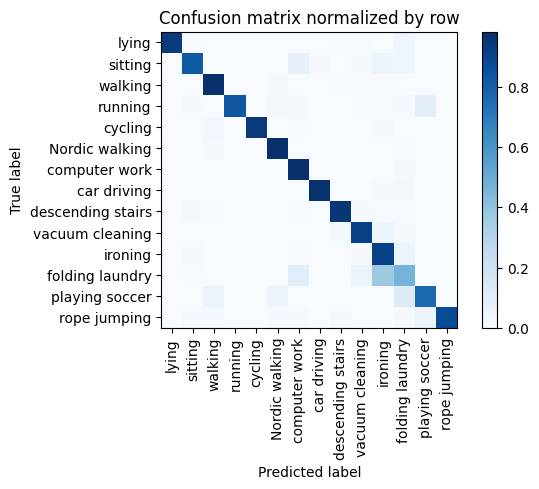

Training Epoch:   7%|▋         | 1/15 [01:09<16:06, 69.02s/it]

Overall accuracy: 0.911

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.923      0.985      0.953      0.157        655|	 folding laundry: 0.012,	ironing: 0.002,	
          walking       0.960      0.978      0.969      0.118        492|	 Nordic walking: 0.008,	vacuum cleaning: 0.006,	
          ironing       0.794      0.918      0.852      0.115        478|	 folding laundry: 0.061,	vacuum cleaning: 0.008,	
            lying       1.000      0.936      0.967      0.087        362|	 folding laundry: 0.041,	vacuum cleaning: 0.006,	
          sitting       0.952      0.820      0.881      0.087        361|	 computer work: 0.069,	ironing: 0.050,	
  vacuum cleaning       0.918      0.916      0.917      0.083        344|	 ironing: 0.049,	descending stairs: 0.017,	
   Nordic walking       0.963      0.980      0.971      0.082        343|	 walking: 0.009,	folding laundry: 0.006,	
          cycling       0.996      0.946


train: 100%|██████████| 261/261 [00:36<00:00,  7.18batch/s, loss=10.2, accuracy=0.969]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:04<00:00, 14.02batch/s, loss=10.3]


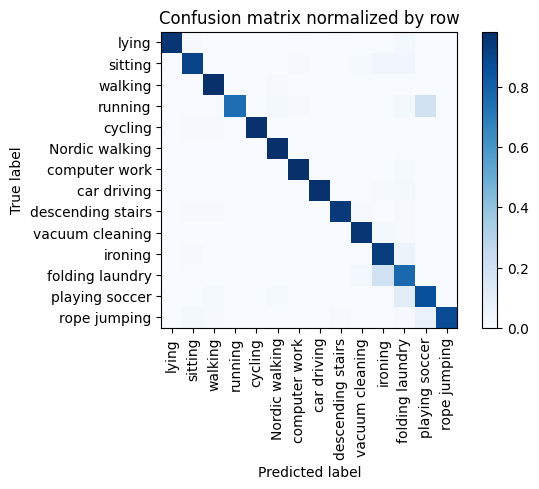

Training Epoch:  13%|█▎        | 2/15 [01:50<11:25, 52.76s/it]

Overall accuracy: 0.941

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.986      0.985      0.985      0.156        651|	 folding laundry: 0.014,	vacuum cleaning: 0.002,	
          walking       0.978      0.982      0.980      0.118        492|	 Nordic walking: 0.008,	vacuum cleaning: 0.006,	
          ironing       0.882      0.931      0.906      0.115        480|	 folding laundry: 0.052,	sitting: 0.010,	
          sitting       0.943      0.909      0.926      0.087        363|	 folding laundry: 0.033,	ironing: 0.033,	
            lying       1.000      0.961      0.980      0.087        362|	 folding laundry: 0.019,	sitting: 0.008,	
  vacuum cleaning       0.946      0.960      0.953      0.083        347|	 ironing: 0.023,	folding laundry: 0.009,	
   Nordic walking       0.977      0.983      0.980      0.082        343|	 folding laundry: 0.006,	walking: 0.006,	
          cycling       1.000      0.977      0.


train: 100%|██████████| 261/261 [00:37<00:00,  6.90batch/s, loss=11, accuracy=0.953]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:04<00:00, 14.06batch/s, loss=10.2]


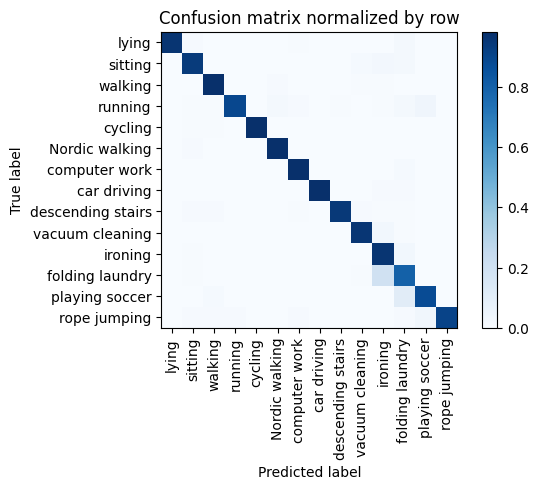

Training Epoch:  20%|██        | 3/15 [02:33<09:38, 48.24s/it]

Overall accuracy: 0.956

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.991      0.985      0.988      0.158        656|	 folding laundry: 0.012,	vacuum cleaning: 0.002,	
          walking       0.982      0.982      0.982      0.118        489|	 Nordic walking: 0.008,	vacuum cleaning: 0.006,	
          ironing       0.884      0.963      0.922      0.116        482|	 folding laundry: 0.029,	sitting: 0.006,	
            lying       1.000      0.964      0.982      0.087        362|	 folding laundry: 0.019,	sitting: 0.008,	
          sitting       0.950      0.942      0.946      0.087        361|	 ironing: 0.025,	folding laundry: 0.019,	
  vacuum cleaning       0.962      0.959      0.961      0.083        344|	 ironing: 0.029,	folding laundry: 0.006,	
   Nordic walking       0.980      0.982      0.981      0.082        342|	 sitting: 0.009,	folding laundry: 0.003,	
          cycling       1.000      0.983      0.


train: 100%|██████████| 261/261 [00:39<00:00,  6.64batch/s, loss=10.9, accuracy=0.922]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:04<00:00, 13.58batch/s, loss=10.8]


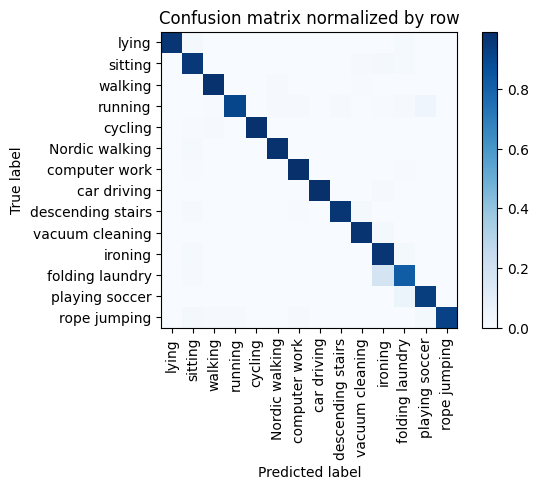

Training Epoch:  27%|██▋       | 4/15 [03:17<08:34, 46.75s/it]

Overall accuracy: 0.963

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.992      0.988      0.990      0.157        653|	 folding laundry: 0.008,	sitting: 0.005,	
          walking       0.988      0.982      0.985      0.118        491|	 Nordic walking: 0.008,	vacuum cleaning: 0.006,	
          ironing       0.906      0.965      0.935      0.116        482|	 folding laundry: 0.021,	sitting: 0.012,	
            lying       1.000      0.967      0.983      0.087        363|	 sitting: 0.017,	folding laundry: 0.014,	
          sitting       0.925      0.959      0.942      0.087        362|	 ironing: 0.019,	folding laundry: 0.014,	
  vacuum cleaning       0.971      0.974      0.972      0.082        342|	 ironing: 0.018,	folding laundry: 0.003,	
   Nordic walking       0.982      0.982      0.982      0.082        342|	 sitting: 0.012,	folding laundry: 0.003,	
          cycling       1.000      0.980      0.990     


train: 100%|██████████| 261/261 [00:40<00:00,  6.37batch/s, loss=10.6, accuracy=0.984]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:04<00:00, 13.10batch/s, loss=10.5]


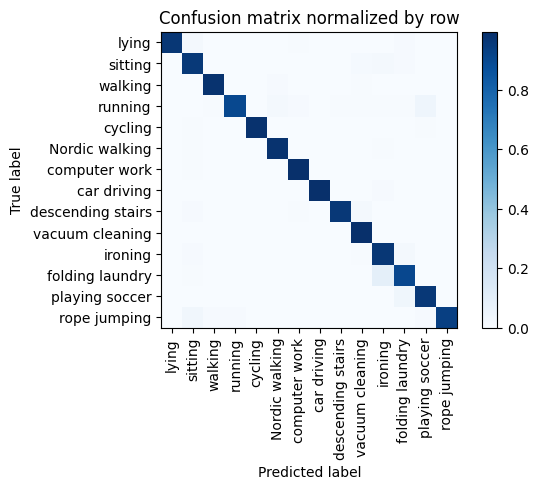

Training Epoch:  33%|███▎      | 5/15 [04:04<07:45, 46.59s/it]

Overall accuracy: 0.970

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.992      0.994      0.993      0.158        658|	 sitting: 0.005,	folding laundry: 0.002,	
          walking       0.992      0.980      0.986      0.118        491|	 Nordic walking: 0.008,	vacuum cleaning: 0.006,	
          ironing       0.937      0.965      0.951      0.116        481|	 folding laundry: 0.019,	sitting: 0.010,	
            lying       1.000      0.967      0.983      0.087        363|	 sitting: 0.017,	folding laundry: 0.008,	
          sitting       0.935      0.956      0.945      0.087        361|	 ironing: 0.022,	vacuum cleaning: 0.014,	
  vacuum cleaning       0.955      0.994      0.974      0.082        343|	 ironing: 0.003,	descending stairs: 0.003,	
   Nordic walking       0.980      0.982      0.981      0.082        342|	 ironing: 0.006,	sitting: 0.006,	
          cycling       1.000      0.983      0.992      0.072


train: 100%|██████████| 261/261 [00:41<00:00,  6.32batch/s, loss=9.39, accuracy=0.984]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:04<00:00, 13.09batch/s, loss=9.89]


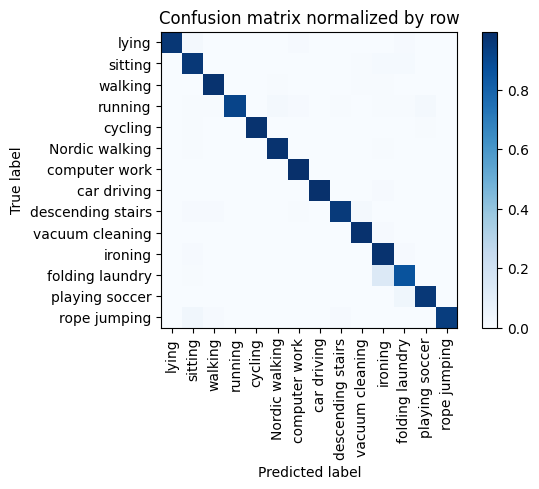

Training Epoch:  40%|████      | 6/15 [04:50<06:59, 46.64s/it]

Overall accuracy: 0.971

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.989      0.995      0.992      0.158        656|	 sitting: 0.003,	folding laundry: 0.002,	
          walking       0.988      0.984      0.986      0.118        489|	 vacuum cleaning: 0.006,	Nordic walking: 0.006,	
          ironing       0.922      0.981      0.951      0.116        481|	 folding laundry: 0.008,	sitting: 0.008,	
          sitting       0.938      0.964      0.951      0.087        361|	 folding laundry: 0.014,	ironing: 0.014,	
            lying       1.000      0.967      0.983      0.087        360|	 sitting: 0.017,	folding laundry: 0.008,	
  vacuum cleaning       0.974      0.986      0.980      0.083        346|	 ironing: 0.012,	descending stairs: 0.003,	
   Nordic walking       0.980      0.983      0.981      0.083        345|	 ironing: 0.006,	sitting: 0.006,	
          cycling       1.000      0.983      0.992      0.072


train: 100%|██████████| 261/261 [00:41<00:00,  6.35batch/s, loss=10.1, accuracy=0.969]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:04<00:00, 13.13batch/s, loss=9]   


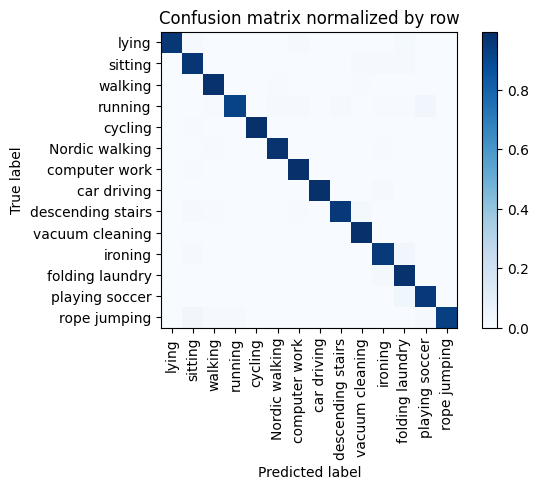

Training Epoch:  47%|████▋     | 7/15 [05:37<06:12, 46.57s/it]

Overall accuracy: 0.976

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.989      0.994      0.992      0.157        654|	 sitting: 0.005,	folding laundry: 0.002,	
          walking       0.990      0.984      0.987      0.118        489|	 vacuum cleaning: 0.006,	Nordic walking: 0.006,	
          ironing       0.975      0.958      0.966      0.115        480|	 folding laundry: 0.031,	sitting: 0.008,	
            lying       1.000      0.967      0.983      0.087        360|	 folding laundry: 0.014,	sitting: 0.011,	
          sitting       0.946      0.969      0.957      0.086        359|	 folding laundry: 0.011,	ironing: 0.008,	
  vacuum cleaning       0.972      0.994      0.983      0.083        347|	 ironing: 0.003,	sitting: 0.003,	
   Nordic walking       0.985      0.982      0.984      0.082        342|	 ironing: 0.006,	walking: 0.006,	
          cycling       1.000      0.990      0.995      0.072        29


train: 100%|██████████| 261/261 [00:41<00:00,  6.33batch/s, loss=10.1, accuracy=0.984]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:04<00:00, 13.29batch/s, loss=9.8] 


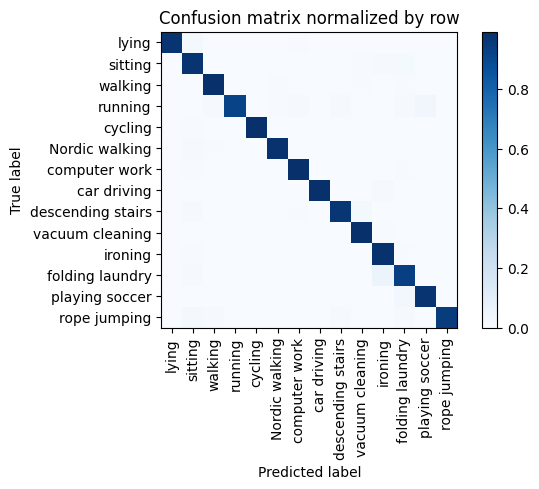

Training Epoch:  53%|█████▎    | 8/15 [06:23<05:25, 46.55s/it]

Overall accuracy: 0.976

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.989      0.991      0.990      0.158        657|	 folding laundry: 0.005,	sitting: 0.005,	
          walking       0.988      0.984      0.986      0.118        489|	 vacuum cleaning: 0.006,	Nordic walking: 0.006,	
          ironing       0.965      0.983      0.974      0.115        477|	 folding laundry: 0.006,	sitting: 0.006,	
            lying       1.000      0.970      0.985      0.087        363|	 sitting: 0.019,	computer work: 0.006,	
          sitting       0.935      0.969      0.952      0.086        359|	 folding laundry: 0.014,	ironing: 0.008,	
   Nordic walking       0.988      0.983      0.985      0.083        345|	 sitting: 0.009,	walking: 0.006,	
  vacuum cleaning       0.977      0.991      0.984      0.083        344|	 ironing: 0.006,	descending stairs: 0.003,	
          cycling       1.000      0.990      0.995      0.071  


train: 100%|██████████| 261/261 [00:42<00:00,  6.20batch/s, loss=10.3, accuracy=0.984]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:05<00:00, 12.83batch/s, loss=8.85]


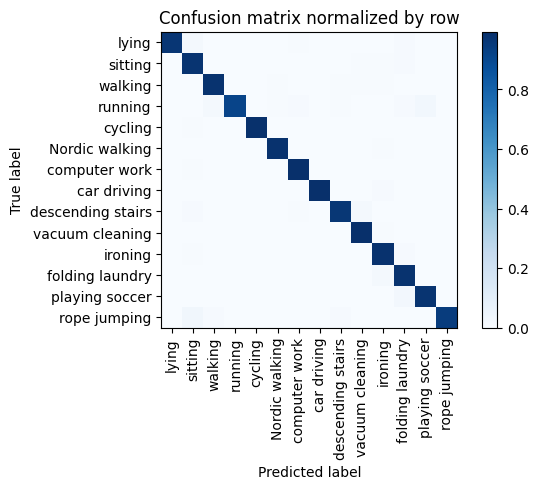

Training Epoch:  60%|██████    | 9/15 [07:11<04:41, 46.86s/it]

Overall accuracy: 0.979

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.991      0.994      0.992      0.158        658|	 sitting: 0.005,	folding laundry: 0.002,	
          walking       0.988      0.980      0.984      0.117        488|	 vacuum cleaning: 0.006,	Nordic walking: 0.006,	
          ironing       0.973      0.983      0.978      0.115        478|	 folding laundry: 0.010,	sitting: 0.006,	
          sitting       0.947      0.975      0.961      0.087        363|	 folding laundry: 0.011,	ironing: 0.006,	
            lying       1.000      0.970      0.985      0.087        363|	 sitting: 0.017,	folding laundry: 0.008,	
  vacuum cleaning       0.977      0.991      0.984      0.083        344|	 ironing: 0.006,	descending stairs: 0.003,	
   Nordic walking       0.988      0.985      0.987      0.082        343|	 ironing: 0.006,	folding laundry: 0.003,	
          cycling       1.000      0.990      0.995   


train: 100%|██████████| 261/261 [00:41<00:00,  6.22batch/s, loss=10.3, accuracy=1]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:05<00:00, 12.92batch/s, loss=9.39]


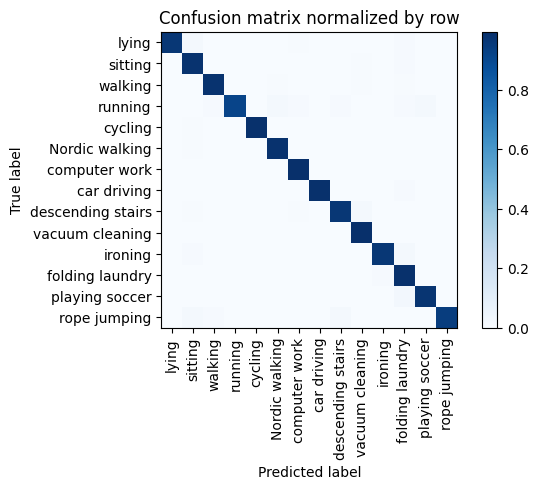

Training Epoch:  67%|██████▋   | 10/15 [07:58<03:55, 47.01s/it]

Overall accuracy: 0.979

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.992      0.995      0.994      0.157        654|	 sitting: 0.003,	folding laundry: 0.002,	
          walking       0.990      0.984      0.987      0.117        487|	 vacuum cleaning: 0.006,	Nordic walking: 0.006,	
          ironing       0.989      0.965      0.977      0.116        481|	 folding laundry: 0.023,	sitting: 0.008,	
          sitting       0.947      0.981      0.963      0.087        362|	 folding laundry: 0.011,	vacuum cleaning: 0.006,	
            lying       1.000      0.967      0.983      0.087        361|	 sitting: 0.017,	folding laundry: 0.008,	
  vacuum cleaning       0.972      0.994      0.983      0.083        345|	 ironing: 0.003,	sitting: 0.003,	
   Nordic walking       0.983      0.986      0.984      0.083        345|	 sitting: 0.006,	folding laundry: 0.003,	
          cycling       1.000      0.990      0.995     


train: 100%|██████████| 261/261 [00:43<00:00,  5.96batch/s, loss=10.1, accuracy=0.953]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:04<00:00, 13.18batch/s, loss=9.93]


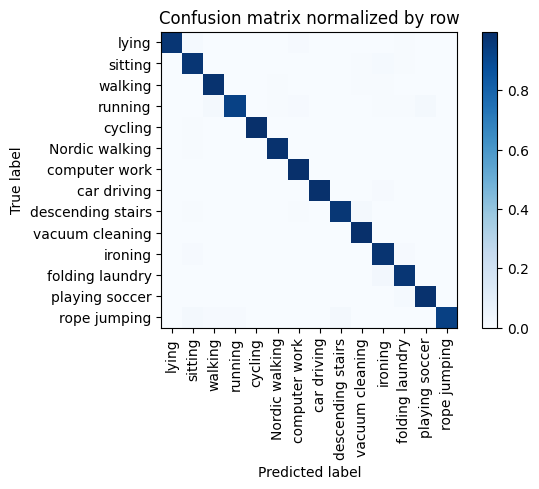

Training Epoch:  73%|███████▎  | 11/15 [08:47<03:10, 47.66s/it]

Overall accuracy: 0.981

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.989      0.997      0.993      0.158        658|	 sitting: 0.003,	rope jumping: 0.000,	
          walking       0.988      0.984      0.986      0.117        486|	 vacuum cleaning: 0.006,	Nordic walking: 0.006,	
          ironing       0.967      0.979      0.973      0.115        480|	 sitting: 0.010,	folding laundry: 0.008,	
            lying       1.000      0.972      0.986      0.087        363|	 sitting: 0.014,	computer work: 0.008,	
          sitting       0.946      0.972      0.959      0.087        362|	 ironing: 0.014,	folding laundry: 0.006,	
  vacuum cleaning       0.974      0.994      0.984      0.083        344|	 ironing: 0.003,	sitting: 0.003,	
   Nordic walking       0.988      0.985      0.987      0.083        344|	 sitting: 0.006,	folding laundry: 0.003,	
          cycling       1.000      0.993      0.997      0.071       


train: 100%|██████████| 261/261 [00:42<00:00,  6.20batch/s, loss=10.8, accuracy=0.953]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:05<00:00, 12.04batch/s, loss=9.51]


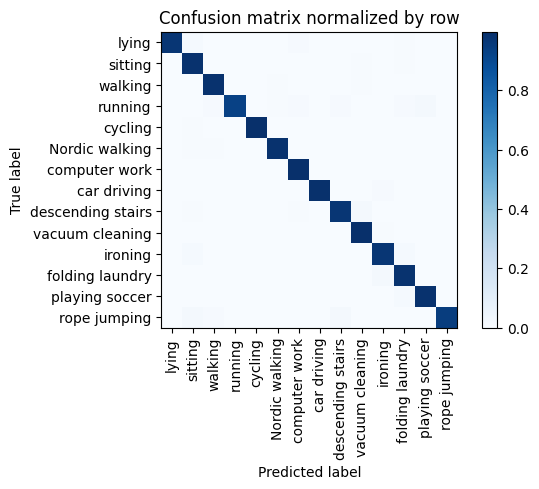

Training Epoch:  80%|████████  | 12/15 [09:35<02:23, 47.74s/it]

Overall accuracy: 0.982

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.991      0.997      0.994      0.157        654|	 sitting: 0.003,	rope jumping: 0.000,	
          walking       0.990      0.988      0.989      0.118        491|	 vacuum cleaning: 0.006,	Nordic walking: 0.006,	
          ironing       0.985      0.973      0.979      0.115        479|	 folding laundry: 0.013,	sitting: 0.013,	
            lying       1.000      0.972      0.986      0.087        363|	 sitting: 0.014,	computer work: 0.008,	
          sitting       0.947      0.986      0.966      0.087        360|	 folding laundry: 0.006,	vacuum cleaning: 0.006,	
   Nordic walking       0.988      0.985      0.987      0.082        343|	 walking: 0.006,	sitting: 0.006,	
  vacuum cleaning       0.977      0.994      0.986      0.082        342|	 ironing: 0.006,	rope jumping: 0.000,	
          cycling       1.000      0.993      0.997      0.072  


train: 100%|██████████| 261/261 [00:43<00:00,  6.00batch/s, loss=9.67, accuracy=0.984]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:05<00:00, 12.83batch/s, loss=9.34]


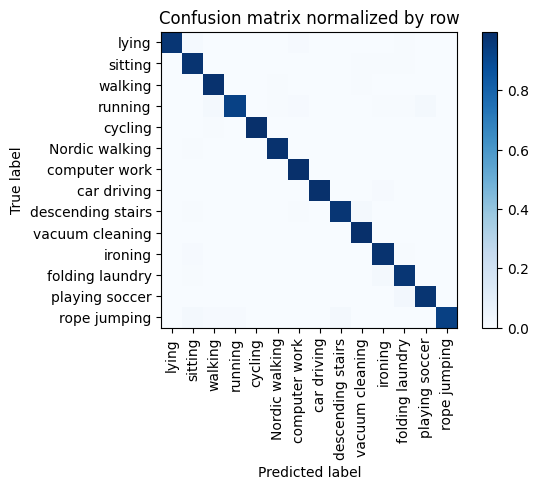

Training Epoch:  87%|████████▋ | 13/15 [10:24<01:36, 48.10s/it]

Overall accuracy: 0.982

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.989      0.997      0.993      0.157        653|	 sitting: 0.003,	rope jumping: 0.000,	
          walking       0.982      0.988      0.985      0.118        489|	 vacuum cleaning: 0.006,	Nordic walking: 0.004,	
          ironing       0.977      0.983      0.980      0.114        476|	 sitting: 0.011,	folding laundry: 0.006,	
          sitting       0.949      0.981      0.965      0.087        363|	 folding laundry: 0.006,	ironing: 0.006,	
            lying       1.000      0.970      0.985      0.087        363|	 sitting: 0.014,	computer work: 0.008,	
  vacuum cleaning       0.977      0.994      0.986      0.084        348|	 ironing: 0.003,	sitting: 0.003,	
   Nordic walking       0.991      0.988      0.990      0.082        342|	 sitting: 0.006,	ironing: 0.003,	
          cycling       1.000      0.993      0.997      0.071        297|	 w


train: 100%|██████████| 261/261 [00:42<00:00,  6.15batch/s, loss=9.68, accuracy=0.969]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:05<00:00, 12.68batch/s, loss=8.65]


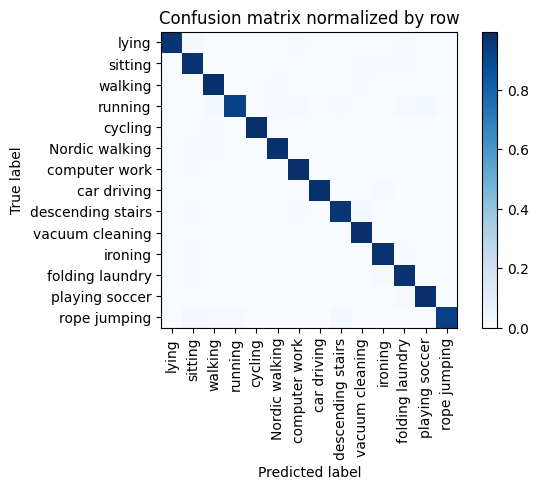

Training Epoch:  93%|█████████▎| 14/15 [11:12<00:48, 48.06s/it]

Overall accuracy: 0.983

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.992      0.995      0.994      0.158        658|	 sitting: 0.005,	rope jumping: 0.000,	
          walking       0.984      0.990      0.987      0.118        491|	 vacuum cleaning: 0.006,	Nordic walking: 0.004,	
          ironing       0.987      0.983      0.985      0.114        476|	 folding laundry: 0.006,	sitting: 0.006,	
            lying       1.000      0.973      0.986      0.087        364|	 sitting: 0.016,	folding laundry: 0.005,	
          sitting       0.949      0.983      0.966      0.087        362|	 folding laundry: 0.006,	ironing: 0.006,	
  vacuum cleaning       0.974      0.994      0.984      0.083        345|	 ironing: 0.003,	sitting: 0.003,	
   Nordic walking       0.991      0.985      0.988      0.082        342|	 walking: 0.006,	sitting: 0.006,	
          cycling       1.000      0.993      0.997      0.071        297|	


train: 100%|██████████| 261/261 [00:42<00:00,  6.12batch/s, loss=9.93, accuracy=0.969]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:05<00:00, 12.65batch/s, loss=8.96]


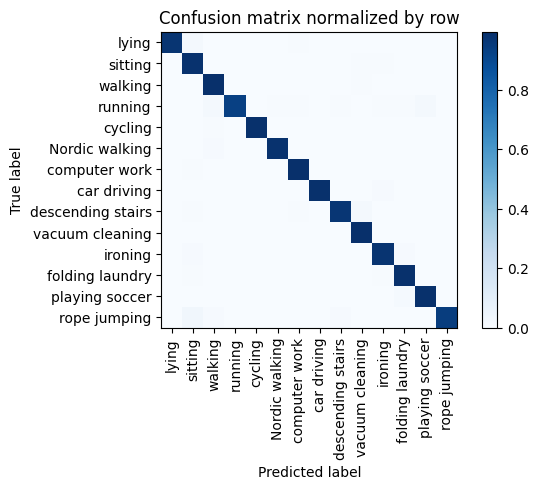

Overall accuracy: 0.984

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.994      0.995      0.995      0.157        654|	 sitting: 0.005,	rope jumping: 0.000,	
          walking       0.982      0.994      0.988      0.118        490|	 vacuum cleaning: 0.006,	rope jumping: 0.000,	
          ironing       0.987      0.979      0.983      0.115        480|	 folding laundry: 0.010,	sitting: 0.008,	
            lying       1.000      0.973      0.986      0.087        364|	 sitting: 0.019,	computer work: 0.005,	
          sitting       0.944      0.986      0.965      0.087        362|	 ironing: 0.006,	vacuum cleaning: 0.006,	
  vacuum cleaning       0.977      0.994      0.986      0.083        344|	 ironing: 0.003,	sitting: 0.003,	
   Nordic walking       0.997      0.985      0.991      0.082        343|	 walking: 0.009,	folding laundry: 0.003,	
          cycling       1.000      0.990      0.995      0.072        2

torch.Size([4, 2048])


unseen: 100%|██████████| 87/87 [00:06<00:00, 13.33batch/s, loss=10.2]


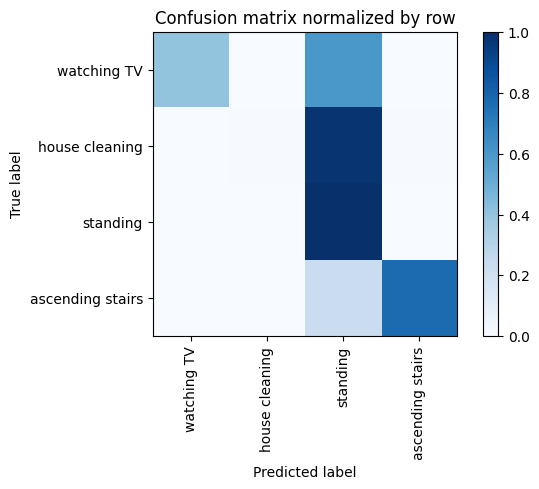

Overall accuracy: 0.541

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.420      1.000      0.591      0.330       1837|	 ascending stairs: 0.000,	house cleaning: 0.000,	
  house cleaning       1.000      0.008      0.015      0.328       1826|	 standing: 0.984,	ascending stairs: 0.005,	
ascending stairs       0.988      0.772      0.867      0.193       1075|	 standing: 0.228,	house cleaning: 0.000,	
     watching TV       0.985      0.399      0.568      0.149        830|	 standing: 0.601,	ascending stairs: 0.000,	

----------------------------------------------------------------------------------------------------
     avg / total       0.804      0.541      0.452 0.9999999999999999       5568|	      

{'accuracy': 0.540948275862069, 'precision': 0.8482030689160086, 'recall': 0.5446388089355307, 'f1': 0.5102403916419964}
================ Fold-1 ================
Unseen Classes : ['walking', 'rope jumping', 'sitting

Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([14, 2048])



train: 100%|██████████| 262/262 [00:43<00:00,  6.08batch/s, loss=11.3, accuracy=0.859]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:05<00:00, 12.59batch/s, loss=10.5]


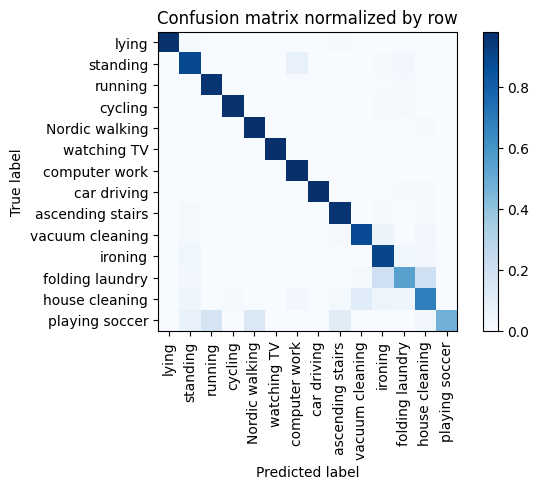

Training Epoch:   7%|▋         | 1/15 [00:48<11:21, 48.66s/it]

Overall accuracy: 0.891

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.926      0.980      0.953      0.136        564|	 ironing: 0.007,	house cleaning: 0.004,	
         ironing       0.824      0.901      0.861      0.116        484|	 folding laundry: 0.035,	standing: 0.035,	
  house cleaning       0.783      0.679      0.728      0.094        393|	 vacuum cleaning: 0.115,	ironing: 0.048,	
  Nordic walking       0.963      0.979      0.971      0.090        373|	 house cleaning: 0.013,	ironing: 0.005,	
        standing       0.836      0.886      0.861      0.089        369|	 computer work: 0.076,	folding laundry: 0.024,	
           lying       0.994      0.969      0.982      0.086        359|	 standing: 0.014,	ascending stairs: 0.011,	
 vacuum cleaning       0.852      0.877      0.864      0.084        349|	 ironing: 0.052,	house cleaning: 0.032,	
         cycling       0.981      0.971      0.976      0.075    


train: 100%|██████████| 262/262 [00:42<00:00,  6.12batch/s, loss=10.7, accuracy=0.875]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:05<00:00, 12.74batch/s, loss=11.1]


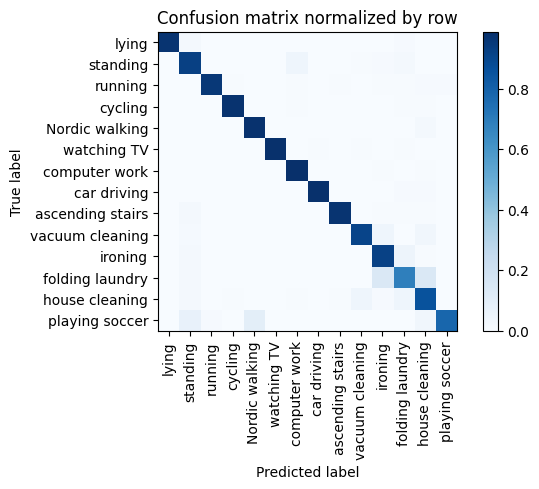

Training Epoch:  13%|█▎        | 2/15 [01:36<10:30, 48.47s/it]

Overall accuracy: 0.931

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.962      0.988      0.975      0.135        563|	 house cleaning: 0.005,	ironing: 0.005,	
         ironing       0.890      0.921      0.905      0.116        483|	 folding laundry: 0.050,	standing: 0.023,	
  house cleaning       0.851      0.860      0.856      0.094        393|	 vacuum cleaning: 0.046,	folding laundry: 0.043,	
  Nordic walking       0.973      0.979      0.976      0.090        375|	 house cleaning: 0.016,	folding laundry: 0.003,	
        standing       0.882      0.925      0.903      0.090        373|	 computer work: 0.046,	folding laundry: 0.016,	
           lying       1.000      0.969      0.984      0.086        358|	 standing: 0.017,	folding laundry: 0.008,	
 vacuum cleaning       0.935      0.908      0.921      0.084        348|	 ironing: 0.043,	house cleaning: 0.032,	
         cycling       0.987      0.974      0.981


train: 100%|██████████| 262/262 [00:43<00:00,  6.07batch/s, loss=10.3, accuracy=0.922]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:05<00:00, 12.69batch/s, loss=9.72]


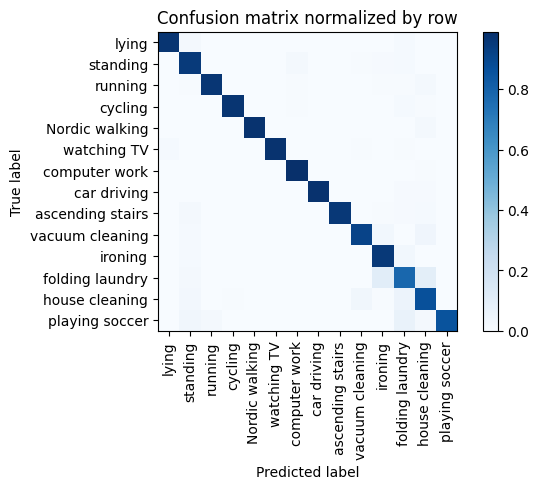

Training Epoch:  20%|██        | 3/15 [02:25<09:42, 48.57s/it]

Overall accuracy: 0.943

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.979      0.989      0.984      0.136        567|	 house cleaning: 0.005,	ironing: 0.004,	
         ironing       0.918      0.955      0.936      0.116        484|	 folding laundry: 0.029,	standing: 0.014,	
  house cleaning       0.863      0.867      0.865      0.094        392|	 folding laundry: 0.056,	vacuum cleaning: 0.033,	
        standing       0.898      0.949      0.923      0.090        373|	 computer work: 0.021,	folding laundry: 0.013,	
  Nordic walking       0.997      0.976      0.986      0.089        371|	 house cleaning: 0.019,	folding laundry: 0.003,	
           lying       0.994      0.969      0.982      0.086        358|	 standing: 0.017,	folding laundry: 0.014,	
 vacuum cleaning       0.949      0.914      0.931      0.083        347|	 house cleaning: 0.040,	ironing: 0.029,	
         cycling       0.993      0.968      0.980


train: 100%|██████████| 262/262 [00:45<00:00,  5.82batch/s, loss=10.6, accuracy=0.938]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:05<00:00, 11.53batch/s, loss=9.22]


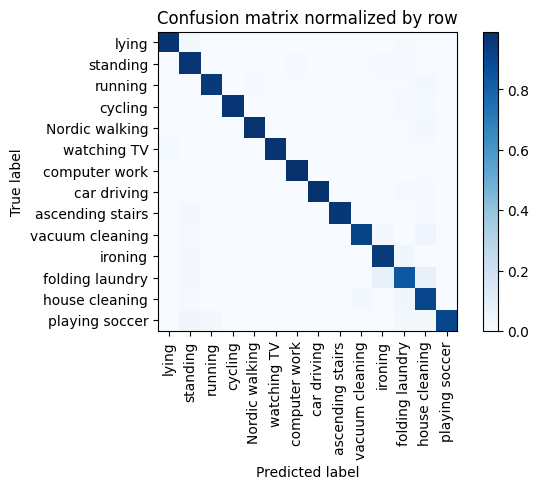

Training Epoch:  27%|██▋       | 4/15 [03:16<09:05, 49.62s/it]

Overall accuracy: 0.951

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.986      0.991      0.989      0.136        565|	 house cleaning: 0.005,	ironing: 0.002,	
         ironing       0.935      0.945      0.940      0.117        487|	 folding laundry: 0.035,	standing: 0.018,	
  house cleaning       0.873      0.909      0.891      0.095        394|	 folding laundry: 0.038,	vacuum cleaning: 0.023,	
  Nordic walking       0.992      0.976      0.984      0.089        371|	 house cleaning: 0.016,	folding laundry: 0.005,	
        standing       0.904      0.968      0.935      0.089        370|	 computer work: 0.011,	folding laundry: 0.008,	
           lying       0.994      0.969      0.982      0.086        357|	 standing: 0.017,	folding laundry: 0.011,	
 vacuum cleaning       0.961      0.917      0.939      0.084        351|	 house cleaning: 0.040,	ironing: 0.028,	
         cycling       0.993      0.965      0.979


train: 100%|██████████| 262/262 [00:48<00:00,  5.37batch/s, loss=10.5, accuracy=0.953]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:05<00:00, 11.94batch/s, loss=9.81]


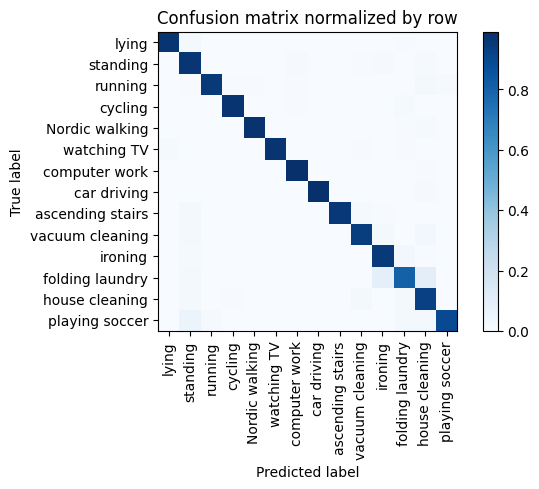

Training Epoch:  33%|███▎      | 5/15 [04:11<08:34, 51.44s/it]

Overall accuracy: 0.955

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.988      0.991      0.989      0.136        565|	 house cleaning: 0.005,	ironing: 0.004,	
         ironing       0.937      0.951      0.944      0.117        487|	 folding laundry: 0.029,	standing: 0.012,	
  house cleaning       0.883      0.928      0.905      0.094        389|	 folding laundry: 0.023,	standing: 0.021,	
  Nordic walking       0.997      0.976      0.986      0.090        373|	 house cleaning: 0.013,	folding laundry: 0.005,	
        standing       0.897      0.968      0.931      0.089        371|	 computer work: 0.011,	house cleaning: 0.008,	
           lying       0.994      0.975      0.985      0.087        360|	 standing: 0.017,	folding laundry: 0.006,	
 vacuum cleaning       0.956      0.937      0.947      0.084        350|	 house cleaning: 0.026,	ironing: 0.020,	
         cycling       0.990      0.974      0.982      0.


train: 100%|██████████| 262/262 [00:46<00:00,  5.59batch/s, loss=10.3, accuracy=0.969]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:05<00:00, 11.89batch/s, loss=9.63]


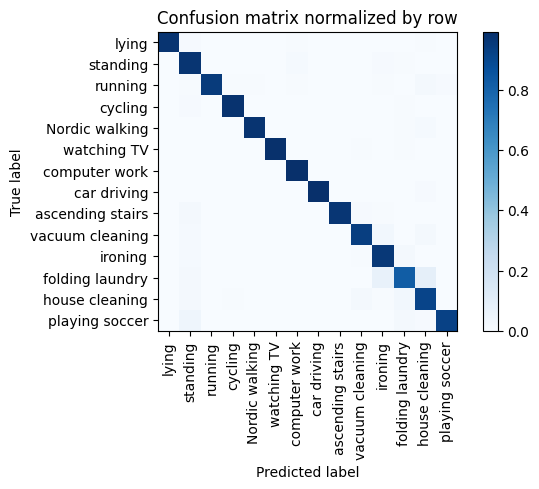

Training Epoch:  40%|████      | 6/15 [05:04<07:46, 51.88s/it]

Overall accuracy: 0.958

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.986      0.993      0.989      0.136        564|	 ironing: 0.004,	house cleaning: 0.002,	
         ironing       0.930      0.959      0.944      0.116        484|	 folding laundry: 0.023,	standing: 0.012,	
  house cleaning       0.909      0.914      0.911      0.095        394|	 folding laundry: 0.030,	vacuum cleaning: 0.020,	
  Nordic walking       0.997      0.976      0.986      0.090        373|	 house cleaning: 0.013,	folding laundry: 0.005,	
        standing       0.905      0.970      0.936      0.089        372|	 computer work: 0.013,	ironing: 0.008,	
           lying       1.000      0.975      0.987      0.086        359|	 standing: 0.011,	house cleaning: 0.006,	
 vacuum cleaning       0.956      0.937      0.946      0.083        347|	 ironing: 0.029,	house cleaning: 0.017,	
         cycling       0.987      0.981      0.984      0.0


train: 100%|██████████| 262/262 [00:46<00:00,  5.60batch/s, loss=9.31, accuracy=0.953]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:05<00:00, 12.05batch/s, loss=9.94]


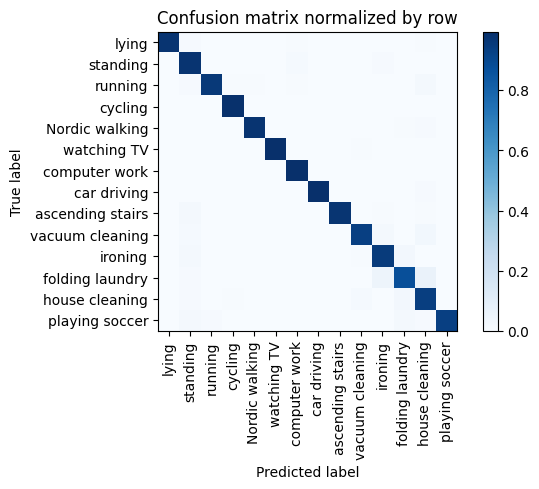

Training Epoch:  47%|████▋     | 7/15 [05:56<06:56, 52.12s/it]

Overall accuracy: 0.964

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.982      0.995      0.989      0.136        564|	 house cleaning: 0.002,	folding laundry: 0.002,	
         ironing       0.950      0.950      0.950      0.116        484|	 folding laundry: 0.025,	standing: 0.019,	
  house cleaning       0.910      0.939      0.924      0.095        396|	 folding laundry: 0.025,	vacuum cleaning: 0.013,	
  Nordic walking       0.997      0.978      0.988      0.089        371|	 house cleaning: 0.011,	folding laundry: 0.005,	
        standing       0.919      0.976      0.946      0.089        370|	 computer work: 0.014,	ironing: 0.008,	
           lying       1.000      0.978      0.989      0.087        361|	 standing: 0.008,	house cleaning: 0.006,	
 vacuum cleaning       0.973      0.934      0.953      0.084        350|	 house cleaning: 0.029,	ironing: 0.023,	
         cycling       0.987      0.987      0.987 


train: 100%|██████████| 262/262 [00:43<00:00,  6.06batch/s, loss=9.99, accuracy=0.984]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:05<00:00, 12.61batch/s, loss=8.63]


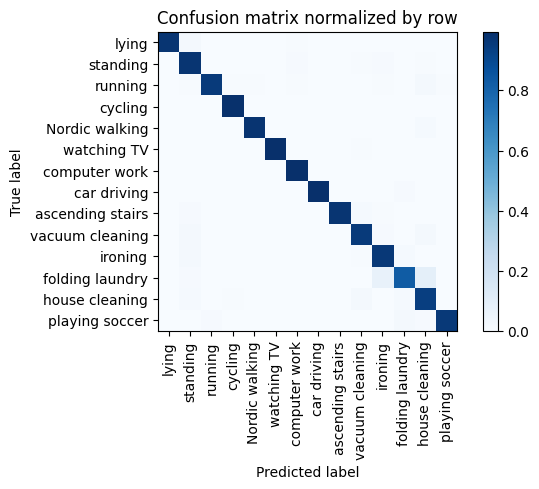

Training Epoch:  53%|█████▎    | 8/15 [06:45<05:57, 51.07s/it]

Overall accuracy: 0.965

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.988      0.995      0.991      0.137        569|	 ironing: 0.004,	house cleaning: 0.002,	
         ironing       0.949      0.961      0.955      0.116        484|	 standing: 0.019,	folding laundry: 0.014,	
  house cleaning       0.911      0.939      0.924      0.094        391|	 vacuum cleaning: 0.023,	standing: 0.015,	
  Nordic walking       0.997      0.979      0.988      0.090        373|	 house cleaning: 0.013,	folding laundry: 0.003,	
        standing       0.914      0.973      0.943      0.089        372|	 ironing: 0.008,	computer work: 0.008,	
           lying       1.000      0.974      0.987      0.084        350|	 standing: 0.017,	computer work: 0.006,	
 vacuum cleaning       0.946      0.954      0.950      0.084        349|	 house cleaning: 0.017,	standing: 0.017,	
         cycling       0.990      0.990      0.990      0.075     


train: 100%|██████████| 262/262 [00:43<00:00,  5.96batch/s, loss=9.14, accuracy=0.953]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:06<00:00, 10.77batch/s, loss=9.42]


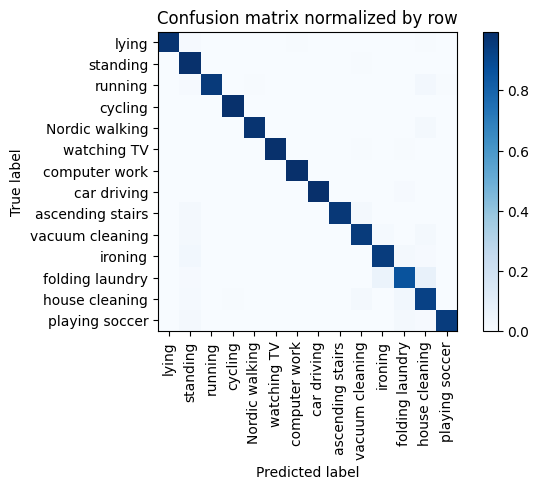

Training Epoch:  60%|██████    | 9/15 [07:36<05:05, 50.93s/it]

Overall accuracy: 0.964

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.995      0.995      0.995      0.136        567|	 house cleaning: 0.002,	ironing: 0.002,	
         ironing       0.962      0.944      0.953      0.117        485|	 standing: 0.029,	folding laundry: 0.016,	
  house cleaning       0.903      0.929      0.916      0.094        392|	 folding laundry: 0.031,	vacuum cleaning: 0.020,	
  Nordic walking       0.997      0.976      0.986      0.089        372|	 house cleaning: 0.016,	folding laundry: 0.003,	
        standing       0.900      0.989      0.942      0.089        372|	 vacuum cleaning: 0.005,	house cleaning: 0.003,	
           lying       1.000      0.978      0.989      0.086        357|	 standing: 0.008,	house cleaning: 0.006,	
 vacuum cleaning       0.951      0.951      0.951      0.084        349|	 house cleaning: 0.017,	standing: 0.017,	
         cycling       0.994      0.990      0.99


train: 100%|██████████| 262/262 [00:50<00:00,  5.23batch/s, loss=10.2, accuracy=0.953]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:05<00:00, 11.35batch/s, loss=9.85]


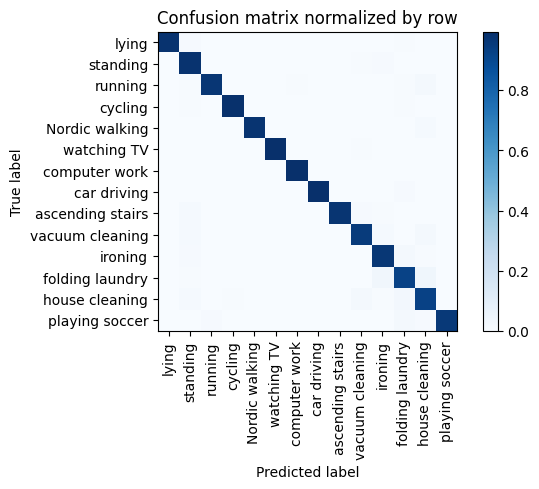

Training Epoch:  67%|██████▋   | 10/15 [08:32<04:23, 52.61s/it]

Overall accuracy: 0.970

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.995      0.995      0.995      0.136        566|	 house cleaning: 0.002,	ironing: 0.002,	
         ironing       0.963      0.965      0.964      0.117        485|	 folding laundry: 0.019,	standing: 0.010,	
  house cleaning       0.929      0.926      0.928      0.095        394|	 folding laundry: 0.025,	vacuum cleaning: 0.020,	
  Nordic walking       1.000      0.979      0.989      0.090        375|	 house cleaning: 0.013,	folding laundry: 0.003,	
        standing       0.929      0.981      0.954      0.089        372|	 ironing: 0.008,	vacuum cleaning: 0.005,	
           lying       1.000      0.980      0.990      0.085        354|	 standing: 0.008,	folding laundry: 0.006,	
 vacuum cleaning       0.957      0.951      0.954      0.084        348|	 house cleaning: 0.020,	ironing: 0.014,	
         cycling       0.994      0.987      0.990      


train: 100%|██████████| 262/262 [00:44<00:00,  5.83batch/s, loss=9.52, accuracy=0.984]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:05<00:00, 12.25batch/s, loss=9.83]


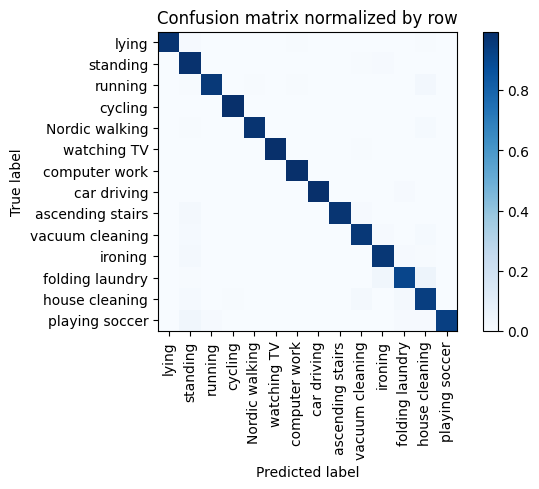

Training Epoch:  73%|███████▎  | 11/15 [09:23<03:28, 52.06s/it]

Overall accuracy: 0.971

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.991      0.995      0.993      0.136        566|	 house cleaning: 0.002,	ironing: 0.002,	
         ironing       0.973      0.965      0.969      0.116        483|	 standing: 0.017,	folding laundry: 0.010,	
  house cleaning       0.923      0.939      0.931      0.095        394|	 folding laundry: 0.020,	vacuum cleaning: 0.018,	
        standing       0.915      0.984      0.948      0.090        373|	 ironing: 0.008,	vacuum cleaning: 0.005,	
  Nordic walking       0.997      0.978      0.988      0.089        370|	 house cleaning: 0.014,	standing: 0.005,	
           lying       1.000      0.978      0.989      0.086        357|	 standing: 0.008,	house cleaning: 0.006,	
 vacuum cleaning       0.963      0.963      0.963      0.084        348|	 house cleaning: 0.014,	standing: 0.014,	
         cycling       0.994      0.994      0.994      0.075  


train: 100%|██████████| 262/262 [00:48<00:00,  5.40batch/s, loss=9.77, accuracy=0.984]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:05<00:00, 11.96batch/s, loss=9.22]


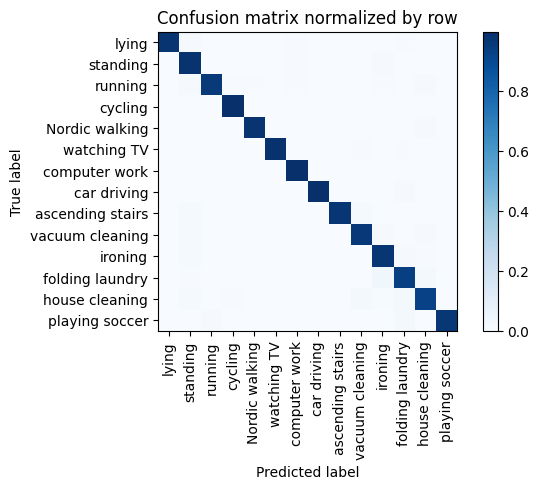

Training Epoch:  80%|████████  | 12/15 [10:18<02:38, 52.82s/it]

Overall accuracy: 0.973

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.988      0.995      0.991      0.137        568|	 house cleaning: 0.002,	ironing: 0.002,	
         ironing       0.963      0.971      0.967      0.116        484|	 standing: 0.012,	folding laundry: 0.008,	
  house cleaning       0.953      0.929      0.941      0.094        392|	 folding laundry: 0.020,	vacuum cleaning: 0.020,	
  Nordic walking       0.997      0.978      0.988      0.089        372|	 house cleaning: 0.011,	folding laundry: 0.003,	
        standing       0.929      0.984      0.955      0.089        371|	 ironing: 0.008,	computer work: 0.005,	
           lying       1.000      0.978      0.989      0.086        359|	 standing: 0.008,	folding laundry: 0.006,	
 vacuum cleaning       0.957      0.965      0.961      0.083        347|	 standing: 0.014,	house cleaning: 0.012,	
         cycling       0.987      0.997      0.992      0


train: 100%|██████████| 262/262 [00:46<00:00,  5.58batch/s, loss=9.06, accuracy=1]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:05<00:00, 11.67batch/s, loss=8.47]


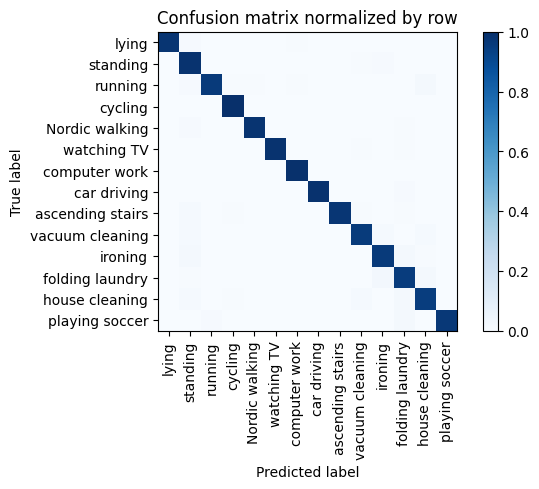

Training Epoch:  87%|████████▋ | 13/15 [11:11<01:45, 52.87s/it]

Overall accuracy: 0.975

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.995      0.995      0.995      0.136        567|	 house cleaning: 0.002,	folding laundry: 0.002,	
         ironing       0.971      0.961      0.966      0.117        485|	 folding laundry: 0.016,	standing: 0.016,	
  house cleaning       0.959      0.946      0.952      0.094        391|	 folding laundry: 0.020,	standing: 0.015,	
  Nordic walking       0.997      0.984      0.991      0.090        374|	 standing: 0.008,	folding laundry: 0.005,	
        standing       0.920      0.987      0.952      0.090        373|	 ironing: 0.008,	vacuum cleaning: 0.005,	
           lying       1.000      0.978      0.989      0.086        358|	 standing: 0.011,	computer work: 0.006,	
 vacuum cleaning       0.968      0.957      0.963      0.084        349|	 house cleaning: 0.014,	ironing: 0.014,	
         cycling       0.987      1.000      0.994      0.075  


train: 100%|██████████| 262/262 [00:49<00:00,  5.26batch/s, loss=9.75, accuracy=0.953]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:05<00:00, 11.61batch/s, loss=8.83]


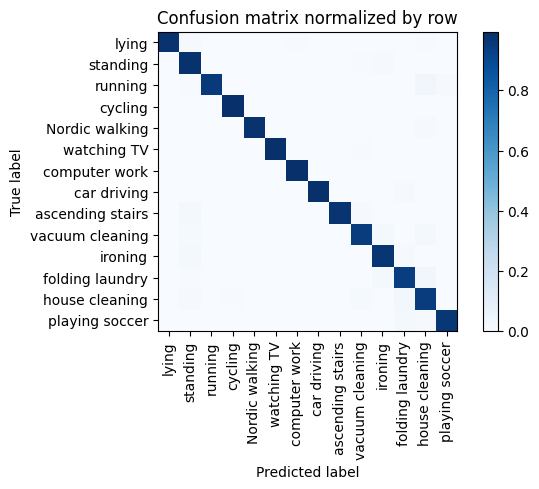

Training Epoch:  93%|█████████▎| 14/15 [12:07<00:53, 53.81s/it]

Overall accuracy: 0.974

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.996      0.995      0.996      0.137        570|	 house cleaning: 0.002,	folding laundry: 0.002,	
         ironing       0.969      0.971      0.970      0.116        484|	 standing: 0.017,	folding laundry: 0.010,	
  house cleaning       0.932      0.946      0.939      0.094        392|	 folding laundry: 0.026,	vacuum cleaning: 0.013,	
  Nordic walking       1.000      0.981      0.991      0.089        372|	 house cleaning: 0.011,	folding laundry: 0.003,	
        standing       0.928      0.984      0.955      0.089        369|	 ironing: 0.008,	vacuum cleaning: 0.005,	
           lying       1.000      0.980      0.990      0.086        358|	 standing: 0.008,	house cleaning: 0.006,	
 vacuum cleaning       0.968      0.948      0.958      0.083        346|	 house cleaning: 0.020,	ironing: 0.017,	
         cycling       0.994      0.994      0.99


train: 100%|██████████| 262/262 [00:47<00:00,  5.49batch/s, loss=10.2, accuracy=0.938]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:05<00:00, 11.49batch/s, loss=9.08]


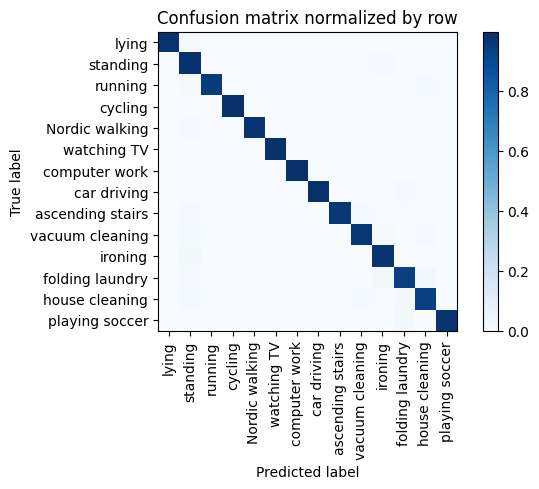

Overall accuracy: 0.974

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.991      0.996      0.994      0.136        567|	 ironing: 0.002,	standing: 0.002,	
         ironing       0.965      0.973      0.969      0.117        486|	 standing: 0.016,	folding laundry: 0.006,	
  house cleaning       0.966      0.934      0.949      0.094        392|	 folding laundry: 0.023,	vacuum cleaning: 0.015,	
  Nordic walking       0.997      0.978      0.988      0.089        370|	 standing: 0.008,	folding laundry: 0.005,	
        standing       0.917      0.986      0.951      0.089        370|	 ironing: 0.008,	vacuum cleaning: 0.005,	
           lying       1.000      0.978      0.989      0.086        358|	 standing: 0.011,	computer work: 0.006,	
 vacuum cleaning       0.960      0.968      0.964      0.084        348|	 standing: 0.014,	house cleaning: 0.009,	
         cycling       0.987      0.994      0.990      0.075        

torch.Size([4, 2048])


unseen: 100%|██████████| 86/86 [00:07<00:00, 11.73batch/s, loss=11.5]


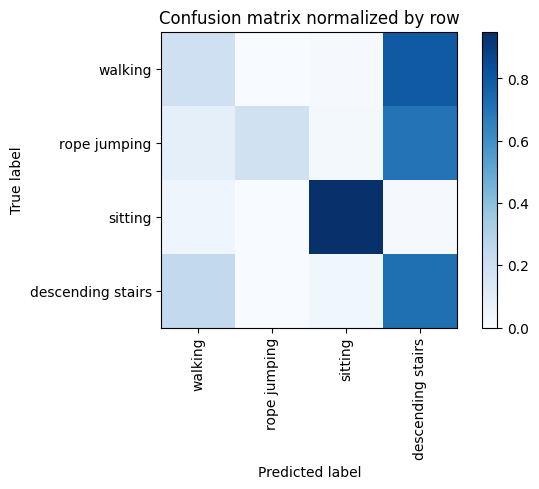

Overall accuracy: 0.531

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.566      0.196      0.291      0.420       2312|	 descending stairs: 0.796,	sitting: 0.008,	
          sitting       0.965      0.950      0.958      0.326       1795|	 walking: 0.042,	descending stairs: 0.008,	
descending stairs       0.237      0.718      0.357      0.171        941|	 walking: 0.248,	sitting: 0.034,	
     rope jumping       1.000      0.189      0.317      0.083        456|	 descending stairs: 0.704,	walking: 0.086,	

----------------------------------------------------------------------------------------------------
      avg / total       0.676      0.531      0.522        1.0       5504|	      

{'accuracy': 0.5305232558139535, 'precision': 0.6920278802119234, 'recall': 0.5131940421620322, 'f1': 0.48062925574794996}
================ Fold-2 ================
Unseen Classes : ['playing soccer', 'lying', 'vacuum cleaning', 'co

Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([14, 2048])



train: 100%|██████████| 242/242 [00:41<00:00,  5.82batch/s, loss=12.1, accuracy=0.891]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:05<00:00, 11.90batch/s, loss=10.6]


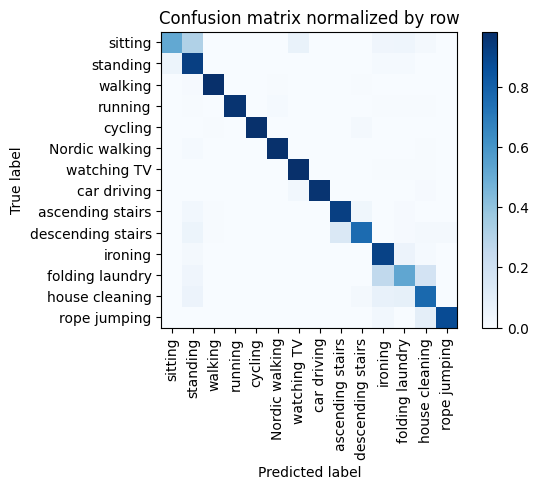

Training Epoch:   7%|▋         | 1/15 [00:47<10:58, 47.01s/it]

Overall accuracy: 0.863

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.987      0.981      0.984      0.125        479|	 standing: 0.010,	descending stairs: 0.004,	
          ironing       0.805      0.910      0.855      0.119        458|	 folding laundry: 0.055,	standing: 0.020,	
         standing       0.664      0.922      0.772      0.097        371|	 sitting: 0.051,	folding laundry: 0.013,	
   Nordic walking       0.989      0.976      0.982      0.096        368|	 standing: 0.014,	house cleaning: 0.005,	
   house cleaning       0.810      0.766      0.788      0.091        351|	 folding laundry: 0.083,	ironing: 0.071,	
          sitting       0.904      0.517      0.658      0.090        344|	 standing: 0.314,	watching TV: 0.067,	
          cycling       1.000      0.975      0.988      0.084        324|	 descending stairs: 0.015,	walking: 0.006,	
 ascending stairs       0.892      0.921      0.907      0.0


train: 100%|██████████| 242/242 [00:42<00:00,  5.69batch/s, loss=12.1, accuracy=0.797]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:04<00:00, 12.25batch/s, loss=10.5]


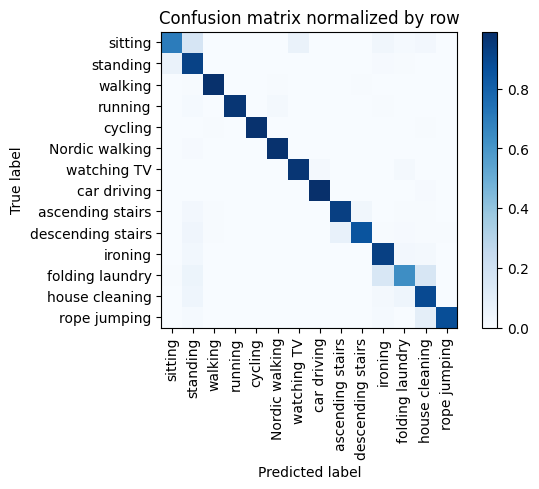

Training Epoch:  13%|█▎        | 2/15 [01:34<10:17, 47.51s/it]

Overall accuracy: 0.905

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.989      0.985      0.987      0.124        478|	 standing: 0.006,	descending stairs: 0.004,	
          ironing       0.887      0.929      0.907      0.121        463|	 standing: 0.030,	folding laundry: 0.024,	
   Nordic walking       0.986      0.981      0.984      0.096        370|	 standing: 0.011,	house cleaning: 0.003,	
         standing       0.737      0.921      0.819      0.095        365|	 sitting: 0.066,	ironing: 0.008,	
   house cleaning       0.835      0.892      0.863      0.092        352|	 folding laundry: 0.043,	standing: 0.043,	
          sitting       0.902      0.698      0.787      0.089        341|	 standing: 0.164,	watching TV: 0.065,	
          cycling       1.000      0.981      0.991      0.084        323|	 house cleaning: 0.006,	walking: 0.006,	
 ascending stairs       0.941      0.929      0.935      0.062        


train: 100%|██████████| 242/242 [00:41<00:00,  5.90batch/s, loss=10.9, accuracy=0.906]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:04<00:00, 12.18batch/s, loss=11]


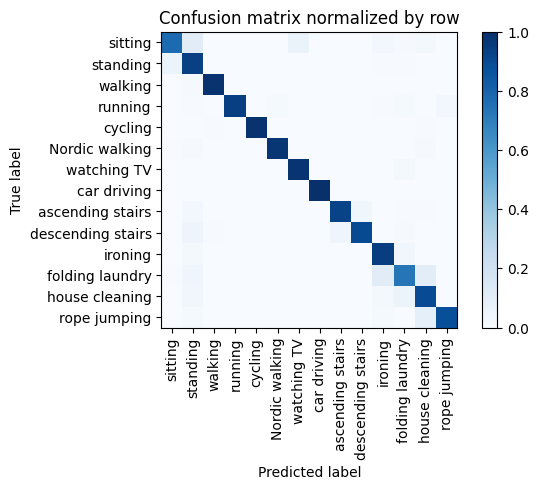

Training Epoch:  20%|██        | 3/15 [02:21<09:23, 46.97s/it]

Overall accuracy: 0.922

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.992      0.985      0.989      0.126        482|	 standing: 0.010,	descending stairs: 0.002,	
          ironing       0.907      0.943      0.925      0.119        456|	 folding laundry: 0.033,	standing: 0.022,	
   Nordic walking       0.992      0.973      0.982      0.097        371|	 house cleaning: 0.008,	standing: 0.008,	
         standing       0.783      0.935      0.852      0.096        370|	 sitting: 0.054,	folding laundry: 0.005,	
   house cleaning       0.886      0.893      0.890      0.090        347|	 folding laundry: 0.052,	standing: 0.035,	
          sitting       0.920      0.770      0.838      0.089        343|	 standing: 0.111,	watching TV: 0.064,	
          cycling       1.000      0.985      0.992      0.084        323|	 house cleaning: 0.006,	walking: 0.006,	
 ascending stairs       0.966      0.926      0.945      0.063


train: 100%|██████████| 242/242 [00:42<00:00,  5.72batch/s, loss=11.8, accuracy=0.812]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:04<00:00, 12.18batch/s, loss=9.68]


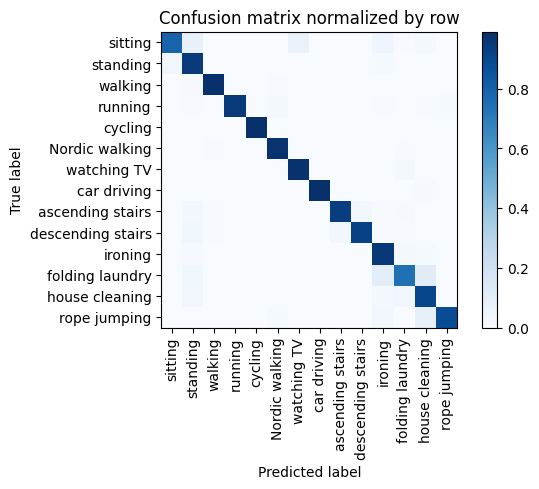

Training Epoch:  27%|██▋       | 4/15 [03:08<08:40, 47.30s/it]

Overall accuracy: 0.932

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.990      0.985      0.987      0.125        480|	 standing: 0.008,	Nordic walking: 0.004,	
          ironing       0.889      0.959      0.923      0.120        461|	 folding laundry: 0.017,	house cleaning: 0.013,	
   Nordic walking       0.984      0.979      0.981      0.097        373|	 folding laundry: 0.005,	walking: 0.005,	
         standing       0.833      0.951      0.888      0.096        368|	 sitting: 0.033,	ironing: 0.014,	
   house cleaning       0.875      0.905      0.890      0.091        348|	 folding laundry: 0.037,	standing: 0.034,	
          sitting       0.954      0.791      0.865      0.089        340|	 standing: 0.076,	watching TV: 0.068,	
          cycling       1.000      0.988      0.994      0.085        325|	 house cleaning: 0.003,	ironing: 0.003,	
 ascending stairs       0.978      0.934      0.955      0.063     


train: 100%|██████████| 242/242 [00:41<00:00,  5.89batch/s, loss=10.3, accuracy=0.953]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:04<00:00, 12.44batch/s, loss=9.68]


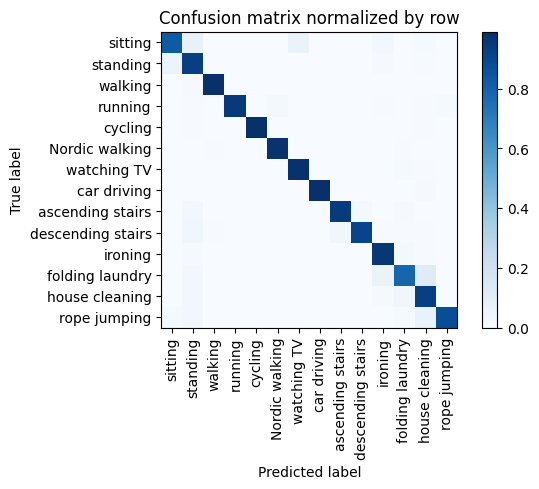

Training Epoch:  33%|███▎      | 5/15 [03:55<07:49, 46.94s/it]

Overall accuracy: 0.939

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.994      0.990      0.992      0.126        484|	 standing: 0.008,	Nordic walking: 0.002,	
          ironing       0.931      0.963      0.946      0.120        459|	 folding laundry: 0.020,	standing: 0.011,	
   Nordic walking       0.989      0.978      0.984      0.097        371|	 folding laundry: 0.005,	walking: 0.005,	
         standing       0.836      0.929      0.880      0.096        368|	 sitting: 0.052,	ironing: 0.011,	
   house cleaning       0.881      0.932      0.906      0.091        351|	 folding laundry: 0.031,	standing: 0.026,	
          sitting       0.930      0.825      0.874      0.088        337|	 standing: 0.071,	watching TV: 0.062,	
          cycling       1.000      0.988      0.994      0.084        323|	 house cleaning: 0.006,	standing: 0.006,	
 ascending stairs       0.974      0.946      0.960      0.062        24


train: 100%|██████████| 242/242 [00:40<00:00,  6.02batch/s, loss=10.5, accuracy=0.938]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:04<00:00, 12.48batch/s, loss=9.79]


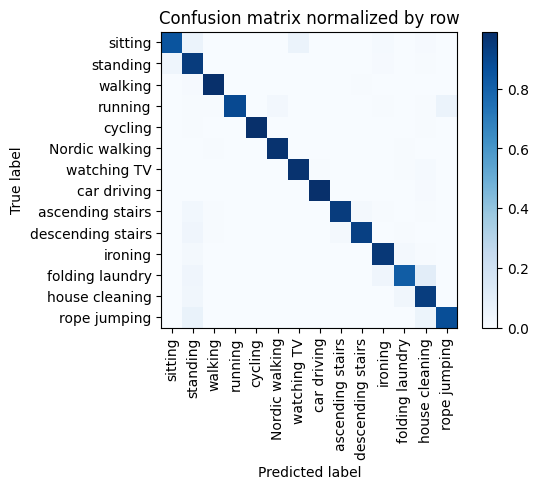

Training Epoch:  40%|████      | 6/15 [04:40<06:57, 46.42s/it]

Overall accuracy: 0.941

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.990      0.988      0.989      0.125        480|	 standing: 0.008,	descending stairs: 0.004,	
          ironing       0.961      0.959      0.960      0.120        460|	 folding laundry: 0.017,	standing: 0.017,	
   Nordic walking       0.989      0.978      0.984      0.096        370|	 folding laundry: 0.005,	walking: 0.005,	
         standing       0.821      0.943      0.878      0.096        370|	 sitting: 0.043,	ironing: 0.008,	
   house cleaning       0.891      0.937      0.913      0.091        349|	 folding laundry: 0.032,	standing: 0.032,	
          sitting       0.945      0.854      0.897      0.089        342|	 watching TV: 0.061,	standing: 0.061,	
          cycling       1.000      0.988      0.994      0.084        323|	 house cleaning: 0.006,	standing: 0.006,	
 ascending stairs       0.983      0.943      0.962      0.064       


train: 100%|██████████| 242/242 [00:40<00:00,  6.03batch/s, loss=10.4, accuracy=0.938]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:04<00:00, 12.80batch/s, loss=9.51]


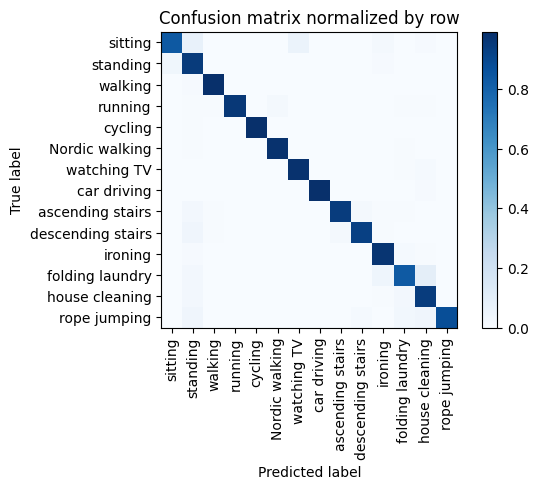

Training Epoch:  47%|████▋     | 7/15 [05:25<06:08, 46.03s/it]

Overall accuracy: 0.946

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.990      0.992      0.991      0.126        483|	 standing: 0.008,	rope jumping: 0.000,	
          ironing       0.949      0.970      0.959      0.121        464|	 folding laundry: 0.013,	standing: 0.011,	
   Nordic walking       0.992      0.981      0.986      0.096        369|	 folding laundry: 0.005,	standing: 0.005,	
         standing       0.831      0.946      0.885      0.096        369|	 sitting: 0.038,	ironing: 0.011,	
   house cleaning       0.906      0.943      0.924      0.091        348|	 folding laundry: 0.026,	standing: 0.026,	
          sitting       0.953      0.833      0.889      0.089        342|	 standing: 0.076,	watching TV: 0.061,	
          cycling       1.000      0.991      0.995      0.084        321|	 standing: 0.006,	walking: 0.003,	
 ascending stairs       0.983      0.941      0.962      0.062        239|	 stan


train: 100%|██████████| 242/242 [00:40<00:00,  6.03batch/s, loss=11.4, accuracy=0.922]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:04<00:00, 12.48batch/s, loss=9.53]


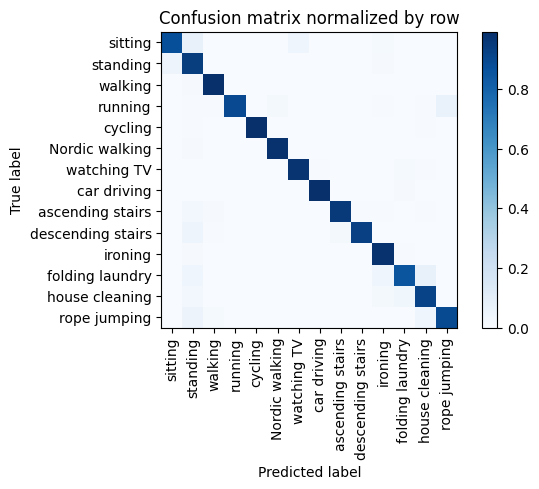

Training Epoch:  53%|█████▎    | 8/15 [06:11<05:20, 45.81s/it]

Overall accuracy: 0.946

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.988      0.992      0.990      0.125        481|	 standing: 0.008,	rope jumping: 0.000,	
          ironing       0.945      0.980      0.963      0.120        459|	 standing: 0.011,	folding laundry: 0.007,	
         standing       0.817      0.941      0.875      0.097        371|	 sitting: 0.049,	ironing: 0.011,	
   Nordic walking       0.992      0.981      0.986      0.096        367|	 standing: 0.011,	house cleaning: 0.003,	
   house cleaning       0.928      0.915      0.921      0.091        351|	 folding laundry: 0.037,	standing: 0.028,	
          sitting       0.943      0.874      0.907      0.089        342|	 standing: 0.070,	watching TV: 0.041,	
          cycling       1.000      0.988      0.994      0.084        324|	 house cleaning: 0.006,	standing: 0.006,	
 ascending stairs       0.983      0.950      0.966      0.063        241|


train: 100%|██████████| 242/242 [00:40<00:00,  6.05batch/s, loss=10.3, accuracy=0.938]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:04<00:00, 12.93batch/s, loss=8.71]


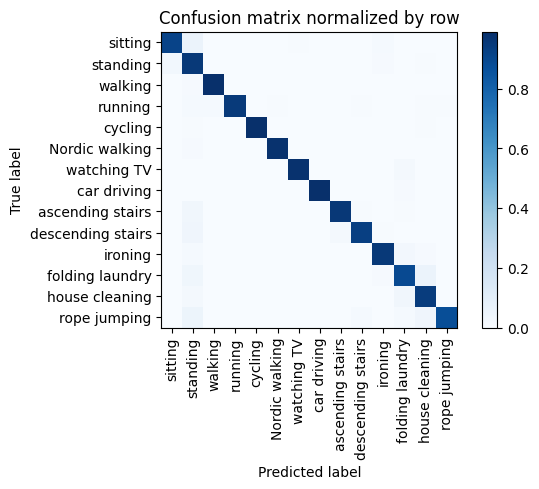

Training Epoch:  60%|██████    | 9/15 [06:56<04:33, 45.57s/it]

Overall accuracy: 0.956

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.994      0.990      0.992      0.126        483|	 standing: 0.008,	descending stairs: 0.002,	
          ironing       0.969      0.952      0.961      0.120        461|	 folding laundry: 0.026,	standing: 0.013,	
   Nordic walking       0.997      0.981      0.989      0.096        369|	 standing: 0.008,	house cleaning: 0.003,	
         standing       0.830      0.954      0.888      0.096        369|	 sitting: 0.030,	ironing: 0.011,	
   house cleaning       0.927      0.943      0.934      0.091        348|	 folding laundry: 0.032,	standing: 0.023,	
          sitting       0.963      0.915      0.939      0.089        342|	 standing: 0.058,	ironing: 0.015,	
          cycling       1.000      0.988      0.994      0.084        324|	 house cleaning: 0.006,	standing: 0.006,	
 ascending stairs       0.983      0.959      0.971      0.063        243


train: 100%|██████████| 242/242 [00:39<00:00,  6.13batch/s, loss=10.4, accuracy=0.953]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:04<00:00, 12.93batch/s, loss=9.47]


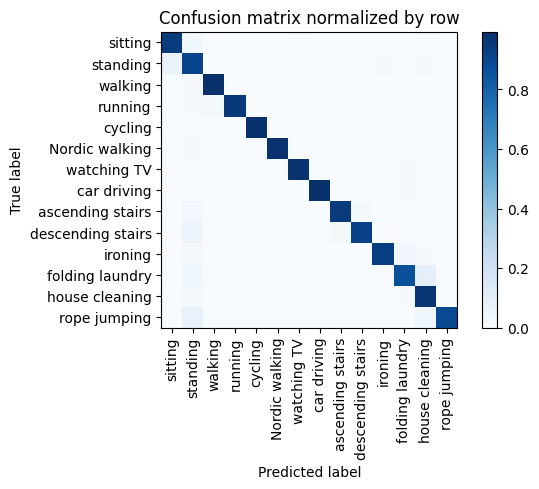

Training Epoch:  67%|██████▋   | 10/15 [07:40<03:46, 45.25s/it]

Overall accuracy: 0.955

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.992      0.988      0.990      0.126        485|	 standing: 0.008,	descending stairs: 0.004,	
          ironing       0.988      0.935      0.961      0.120        459|	 folding laundry: 0.033,	standing: 0.017,	
   Nordic walking       1.000      0.984      0.992      0.097        371|	 standing: 0.011,	walking: 0.003,	
         standing       0.835      0.916      0.873      0.096        369|	 sitting: 0.062,	house cleaning: 0.011,	
   house cleaning       0.904      0.969      0.935      0.091        351|	 standing: 0.020,	folding laundry: 0.011,	
          sitting       0.931      0.950      0.940      0.089        341|	 standing: 0.035,	house cleaning: 0.006,	
          cycling       1.000      0.994      0.997      0.084        322|	 standing: 0.006,	rope jumping: 0.000,	
 ascending stairs       0.983      0.950      0.966      0.063      


train: 100%|██████████| 242/242 [00:42<00:00,  5.64batch/s, loss=10.2, accuracy=0.969]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:04<00:00, 12.25batch/s, loss=9.18]


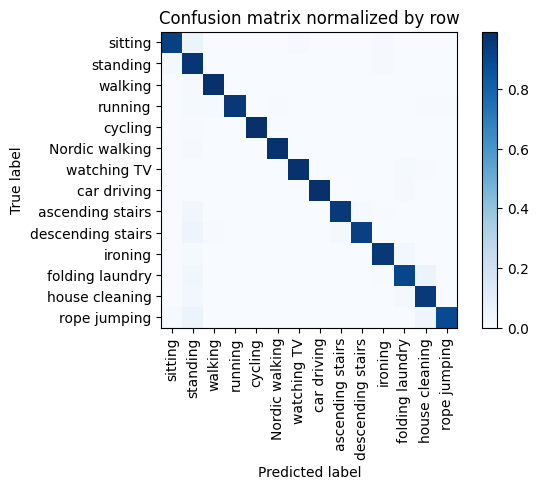

Training Epoch:  73%|███████▎  | 11/15 [08:29<03:04, 46.17s/it]

Overall accuracy: 0.961

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.992      0.992      0.992      0.125        481|	 standing: 0.008,	rope jumping: 0.000,	
          ironing       0.976      0.959      0.967      0.120        460|	 folding laundry: 0.026,	standing: 0.013,	
         standing       0.831      0.968      0.894      0.096        370|	 sitting: 0.016,	ironing: 0.014,	
   Nordic walking       0.997      0.981      0.989      0.096        367|	 standing: 0.011,	house cleaning: 0.003,	
   house cleaning       0.941      0.951      0.946      0.091        350|	 standing: 0.026,	folding laundry: 0.023,	
          sitting       0.979      0.927      0.952      0.090        344|	 standing: 0.052,	ironing: 0.009,	
          cycling       1.000      0.991      0.995      0.084        321|	 standing: 0.006,	house cleaning: 0.003,	
 ascending stairs       0.983      0.950      0.966      0.062        240|	 st


train: 100%|██████████| 242/242 [00:45<00:00,  5.37batch/s, loss=10.1, accuracy=0.953]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:05<00:00, 11.25batch/s, loss=9.12]


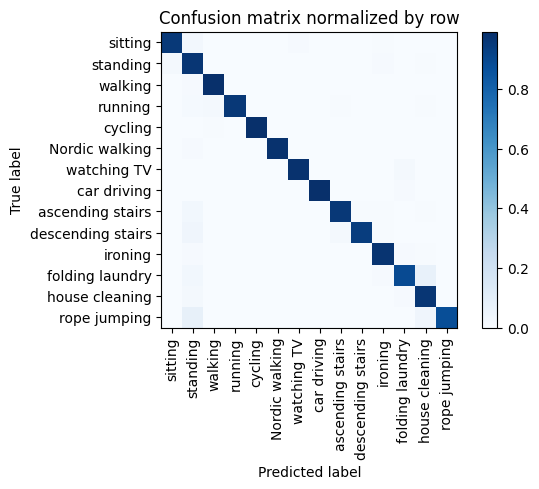

Training Epoch:  80%|████████  | 12/15 [09:19<02:22, 47.57s/it]

Overall accuracy: 0.966

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.988      0.992      0.990      0.125        480|	 standing: 0.008,	rope jumping: 0.000,	
          ironing       0.974      0.974      0.974      0.120        462|	 folding laundry: 0.011,	standing: 0.009,	
   Nordic walking       1.000      0.984      0.992      0.096        369|	 standing: 0.011,	ironing: 0.003,	
         standing       0.859      0.965      0.909      0.096        367|	 sitting: 0.019,	ironing: 0.011,	
   house cleaning       0.931      0.966      0.948      0.091        351|	 standing: 0.020,	folding laundry: 0.011,	
          sitting       0.979      0.956      0.967      0.088        338|	 standing: 0.027,	watching TV: 0.009,	
          cycling       1.000      0.991      0.995      0.084        324|	 walking: 0.006,	standing: 0.003,	
 ascending stairs       0.983      0.959      0.971      0.063        243|	 standing: 0.


train: 100%|██████████| 242/242 [00:44<00:00,  5.40batch/s, loss=9.76, accuracy=1]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:04<00:00, 12.03batch/s, loss=9.63]


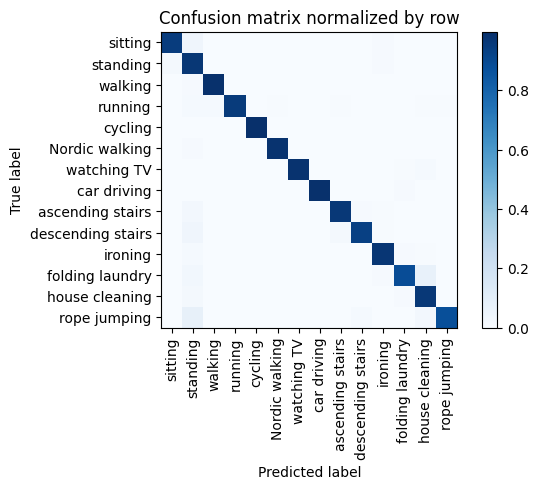

Training Epoch:  87%|████████▋ | 13/15 [10:10<01:36, 48.38s/it]

Overall accuracy: 0.965

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.994      0.990      0.992      0.125        481|	 standing: 0.008,	descending stairs: 0.002,	
          ironing       0.972      0.972      0.972      0.120        459|	 standing: 0.013,	folding laundry: 0.011,	
   Nordic walking       0.997      0.984      0.990      0.096        370|	 standing: 0.008,	ironing: 0.003,	
         standing       0.850      0.968      0.905      0.096        370|	 sitting: 0.022,	ironing: 0.011,	
   house cleaning       0.936      0.963      0.949      0.091        350|	 standing: 0.023,	folding laundry: 0.011,	
          sitting       0.973      0.948      0.960      0.089        343|	 standing: 0.041,	ironing: 0.009,	
          cycling       1.000      0.997      0.998      0.084        322|	 house cleaning: 0.003,	rope jumping: 0.000,	
 ascending stairs       0.979      0.963      0.971      0.063        242|	 


train: 100%|██████████| 242/242 [00:44<00:00,  5.48batch/s, loss=10.6, accuracy=0.969]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:05<00:00, 10.75batch/s, loss=10.3]


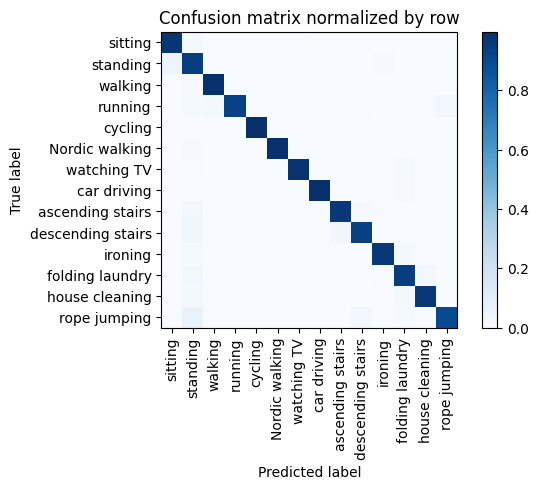

Training Epoch:  93%|█████████▎| 14/15 [11:00<00:48, 48.96s/it]

Overall accuracy: 0.966

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.992      0.988      0.990      0.125        480|	 standing: 0.008,	descending stairs: 0.004,	
          ironing       0.982      0.965      0.974      0.120        462|	 folding laundry: 0.019,	standing: 0.013,	
         standing       0.871      0.941      0.905      0.097        373|	 sitting: 0.048,	ironing: 0.011,	
   Nordic walking       1.000      0.986      0.993      0.096        370|	 standing: 0.011,	walking: 0.003,	
   house cleaning       0.977      0.966      0.971      0.091        349|	 folding laundry: 0.017,	standing: 0.017,	
          sitting       0.946      0.971      0.958      0.089        342|	 standing: 0.018,	watching TV: 0.006,	
          cycling       1.000      0.997      0.998      0.084        324|	 sitting: 0.003,	rope jumping: 0.000,	
 ascending stairs       0.974      0.962      0.968      0.062        238|	 sta


train: 100%|██████████| 242/242 [00:47<00:00,  5.14batch/s, loss=9.86, accuracy=0.969]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:05<00:00, 11.53batch/s, loss=8.92]


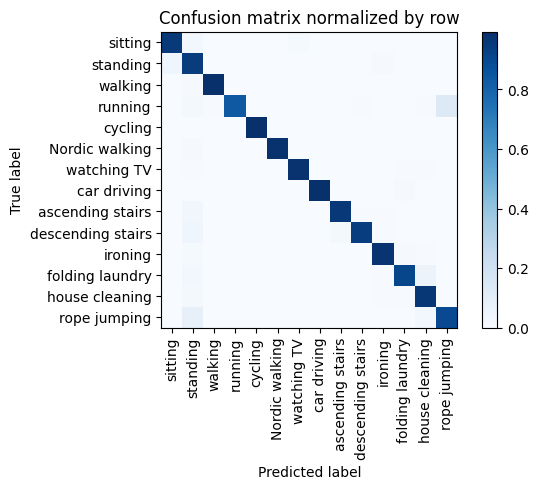

Overall accuracy: 0.960

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.994      0.990      0.992      0.126        483|	 standing: 0.008,	descending stairs: 0.002,	
          ironing       0.976      0.972      0.974      0.121        464|	 standing: 0.013,	folding laundry: 0.009,	
   Nordic walking       1.000      0.984      0.992      0.096        368|	 standing: 0.011,	ironing: 0.003,	
         standing       0.846      0.946      0.893      0.096        367|	 sitting: 0.044,	ironing: 0.011,	
   house cleaning       0.947      0.966      0.956      0.091        350|	 standing: 0.023,	folding laundry: 0.006,	
          sitting       0.950      0.956      0.953      0.088        339|	 standing: 0.027,	watching TV: 0.012,	
          cycling       1.000      0.994      0.997      0.084        322|	 walking: 0.003,	sitting: 0.003,	
 ascending stairs       0.987      0.959      0.973      0.064        244|	 standing

unseen: 100%|██████████| 111/111 [00:09<00:00, 12.15batch/s, loss=12.7]


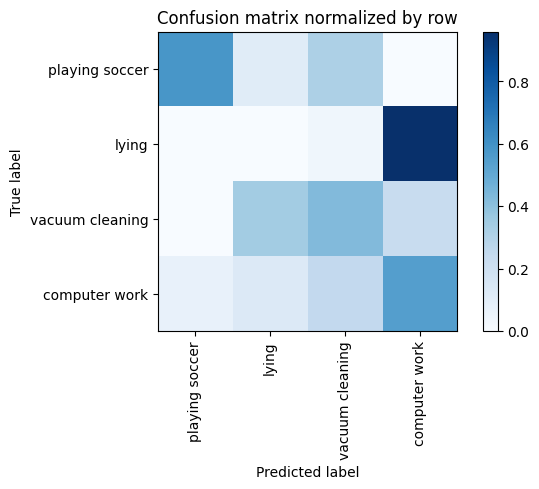

Overall accuracy: 0.376

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.434      0.546      0.484      0.432       3070|	 vacuum cleaning: 0.250,	lying: 0.131,	
          lying       0.006      0.003      0.004      0.264       1874|	 computer work: 0.959,	vacuum cleaning: 0.037,	
vacuum cleaning       0.426      0.426      0.426      0.240       1704|	 lying: 0.344,	computer work: 0.227,	
 playing soccer       0.533      0.579      0.555      0.064        456|	 vacuum cleaning: 0.311,	lying: 0.110,	

----------------------------------------------------------------------------------------------------
    avg / total       0.326      0.376      0.348        1.0       7104|	      

{'accuracy': 0.3761261261261261, 'precision': 0.349770950643682, 'recall': 0.3885334381972029, 'f1': 0.36723572373490376}
================ Fold-3 ================
Unseen Classes : ['cycling', 'running', 'Nordic walking']
per class count :  {'l

Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([15, 2048])



train: 100%|██████████| 276/276 [00:45<00:00,  6.05batch/s, loss=11.6, accuracy=0.812]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:05<00:00, 13.04batch/s, loss=10.7]


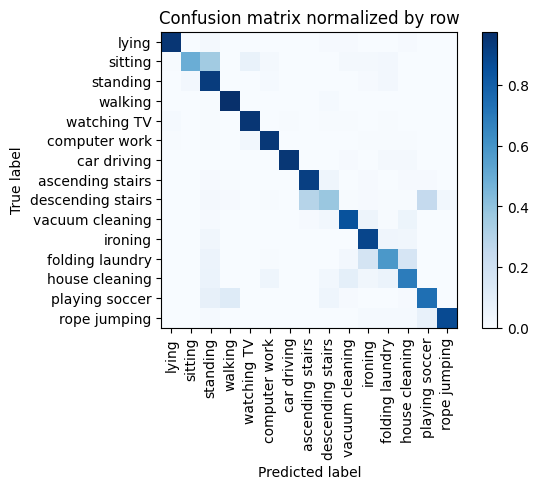

Training Epoch:   7%|▋         | 1/15 [00:51<11:58, 51.31s/it]

Overall accuracy: 0.830

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.953      0.943      0.948      0.135        597|	 watching TV: 0.027,	folding laundry: 0.007,	
          ironing       0.848      0.894      0.870      0.113        498|	 folding laundry: 0.040,	house cleaning: 0.032,	
          walking       0.965      0.977      0.971      0.107        473|	 descending stairs: 0.015,	standing: 0.004,	
            lying       0.981      0.953      0.967      0.086        380|	 standing: 0.016,	descending stairs: 0.011,	
         standing       0.640      0.928      0.757      0.084        373|	 folding laundry: 0.024,	sitting: 0.024,	
   house cleaning       0.751      0.691      0.719      0.079        349|	 vacuum cleaning: 0.089,	folding laundry: 0.060,	
  vacuum cleaning       0.853      0.850      0.851      0.079        347|	 house cleaning: 0.052,	ironing: 0.046,	
          sitting       0.942      0.49


train: 100%|██████████| 276/276 [00:45<00:00,  6.11batch/s, loss=10.9, accuracy=0.828]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:06<00:00, 11.38batch/s, loss=10.3]


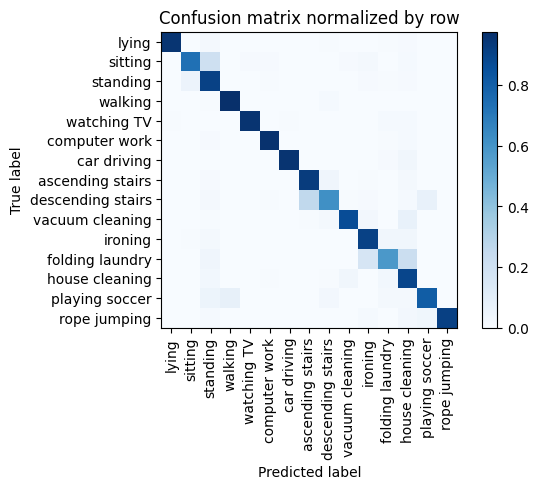

Training Epoch:  13%|█▎        | 2/15 [01:43<11:10, 51.55s/it]

Overall accuracy: 0.885

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.986      0.968      0.977      0.135        596|	 house cleaning: 0.012,	standing: 0.008,	
          ironing       0.883      0.911      0.897      0.113        497|	 house cleaning: 0.034,	folding laundry: 0.032,	
          walking       0.981      0.977      0.979      0.108        475|	 descending stairs: 0.015,	standing: 0.004,	
            lying       0.995      0.955      0.975      0.086        381|	 standing: 0.021,	house cleaning: 0.008,	
         standing       0.730      0.911      0.811      0.084        371|	 sitting: 0.054,	house cleaning: 0.011,	
   house cleaning       0.723      0.894      0.799      0.079        350|	 vacuum cleaning: 0.034,	folding laundry: 0.029,	
  vacuum cleaning       0.943      0.870      0.905      0.078        345|	 house cleaning: 0.072,	ironing: 0.026,	
          sitting       0.914      0.733      0


train: 100%|██████████| 276/276 [00:48<00:00,  5.66batch/s, loss=10.9, accuracy=0.875]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:05<00:00, 11.97batch/s, loss=10.3]


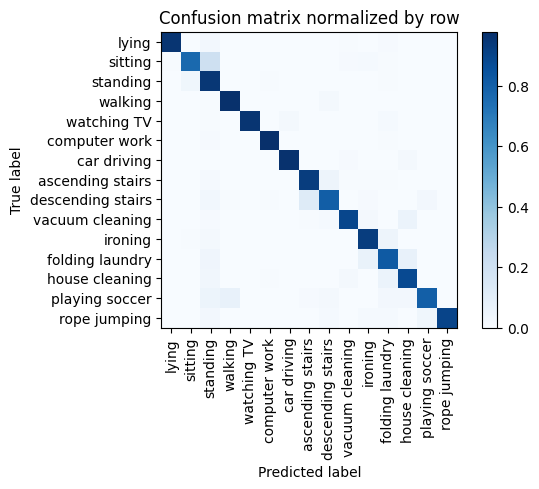

Training Epoch:  20%|██        | 3/15 [02:37<10:37, 53.09s/it]

Overall accuracy: 0.912

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.990      0.978      0.984      0.135        597|	 standing: 0.010,	folding laundry: 0.007,	
          ironing       0.935      0.928      0.932      0.113        499|	 folding laundry: 0.046,	standing: 0.018,	
          walking       0.981      0.973      0.977      0.107        474|	 descending stairs: 0.019,	standing: 0.006,	
            lying       0.995      0.958      0.976      0.086        380|	 standing: 0.024,	folding laundry: 0.008,	
         standing       0.723      0.949      0.821      0.084        371|	 sitting: 0.038,	folding laundry: 0.005,	
   house cleaning       0.875      0.880      0.878      0.079        351|	 folding laundry: 0.060,	standing: 0.034,	
  vacuum cleaning       0.960      0.893      0.925      0.079        347|	 house cleaning: 0.061,	ironing: 0.017,	
          sitting       0.934      0.762      0.839      


train: 100%|██████████| 276/276 [00:47<00:00,  5.76batch/s, loss=10.1, accuracy=1]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:05<00:00, 12.66batch/s, loss=10.2]


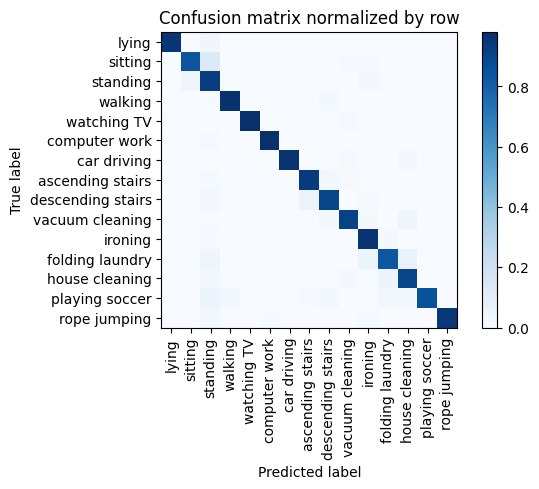

Training Epoch:  27%|██▋       | 4/15 [03:31<09:47, 53.37s/it]

Overall accuracy: 0.932

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.990      0.981      0.986      0.135        594|	 standing: 0.010,	folding laundry: 0.005,	
          ironing       0.927      0.966      0.946      0.113        499|	 folding laundry: 0.022,	standing: 0.010,	
          walking       0.991      0.973      0.982      0.108        476|	 descending stairs: 0.019,	standing: 0.006,	
            lying       0.997      0.955      0.976      0.086        379|	 standing: 0.032,	house cleaning: 0.003,	
         standing       0.764      0.925      0.837      0.084        372|	 sitting: 0.046,	ironing: 0.016,	
   house cleaning       0.902      0.897      0.900      0.079        350|	 folding laundry: 0.049,	standing: 0.026,	
  vacuum cleaning       0.952      0.911      0.931      0.079        347|	 house cleaning: 0.043,	ironing: 0.020,	
          sitting       0.936      0.840      0.886      0.075    


train: 100%|██████████| 276/276 [00:49<00:00,  5.54batch/s, loss=11.4, accuracy=0.953]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:05<00:00, 12.11batch/s, loss=10.4]


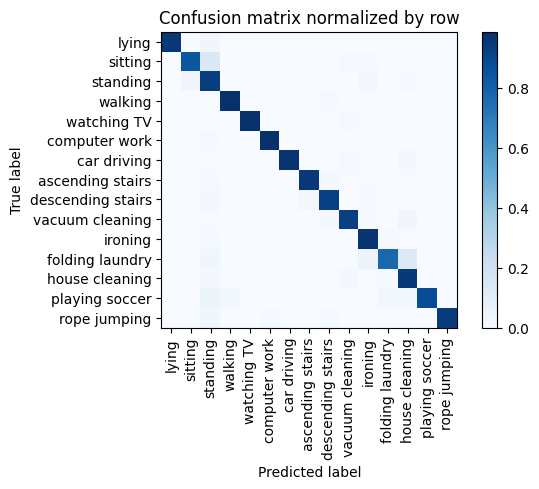

Training Epoch:  33%|███▎      | 5/15 [04:27<09:03, 54.32s/it]

Overall accuracy: 0.939

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.993      0.985      0.989      0.135        596|	 standing: 0.010,	ironing: 0.003,	
          ironing       0.939      0.966      0.952      0.112        496|	 standing: 0.014,	folding laundry: 0.010,	
          walking       0.994      0.981      0.987      0.107        474|	 descending stairs: 0.013,	standing: 0.004,	
            lying       1.000      0.952      0.976      0.086        378|	 standing: 0.034,	house cleaning: 0.003,	
         standing       0.767      0.933      0.842      0.085        374|	 sitting: 0.032,	ironing: 0.016,	
   house cleaning       0.868      0.946      0.905      0.080        353|	 vacuum cleaning: 0.023,	standing: 0.017,	
  vacuum cleaning       0.950      0.922      0.936      0.079        348|	 house cleaning: 0.034,	descending stairs: 0.020,	
          sitting       0.952      0.843      0.895      0.075  


train: 100%|██████████| 276/276 [00:48<00:00,  5.66batch/s, loss=10.8, accuracy=0.922]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:05<00:00, 12.53batch/s, loss=8.87]


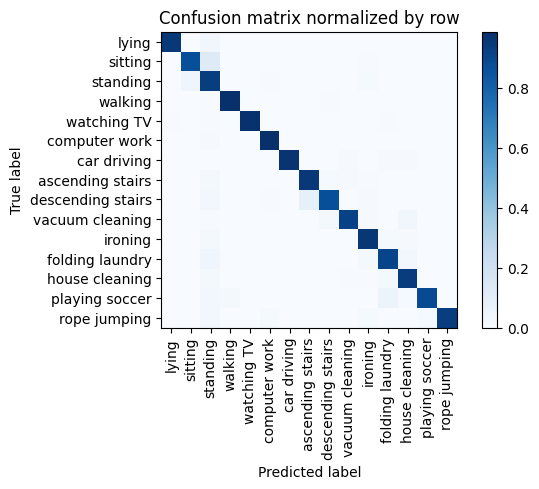

Training Epoch:  40%|████      | 6/15 [05:22<08:10, 54.45s/it]

Overall accuracy: 0.945

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.993      0.985      0.989      0.135        595|	 standing: 0.008,	ironing: 0.003,	
          ironing       0.952      0.960      0.956      0.112        496|	 standing: 0.016,	folding laundry: 0.014,	
          walking       0.996      0.989      0.993      0.107        474|	 descending stairs: 0.004,	standing: 0.004,	
            lying       0.997      0.955      0.976      0.086        381|	 standing: 0.031,	house cleaning: 0.003,	
         standing       0.776      0.933      0.847      0.085        374|	 sitting: 0.043,	ironing: 0.013,	
   house cleaning       0.922      0.943      0.932      0.079        351|	 folding laundry: 0.023,	standing: 0.023,	
  vacuum cleaning       0.979      0.919      0.948      0.079        347|	 house cleaning: 0.037,	descending stairs: 0.023,	
          sitting       0.941      0.870      0.904      0.075  


train: 100%|██████████| 276/276 [00:48<00:00,  5.70batch/s, loss=9.51, accuracy=0.938]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:05<00:00, 12.30batch/s, loss=11]  


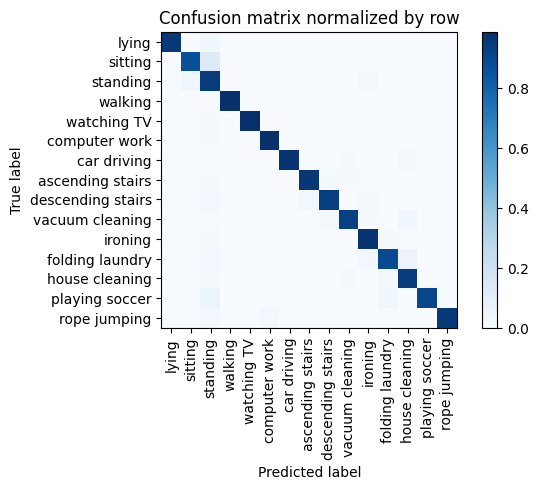

Training Epoch:  47%|████▋     | 7/15 [06:16<07:15, 54.48s/it]

Overall accuracy: 0.949

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.992      0.987      0.989      0.135        595|	 standing: 0.008,	ironing: 0.003,	
          ironing       0.949      0.972      0.960      0.113        497|	 standing: 0.012,	folding laundry: 0.008,	
          walking       1.000      0.987      0.994      0.108        476|	 descending stairs: 0.006,	standing: 0.004,	
            lying       1.000      0.955      0.977      0.086        379|	 standing: 0.037,	house cleaning: 0.003,	
         standing       0.774      0.938      0.848      0.084        373|	 sitting: 0.035,	ironing: 0.016,	
   house cleaning       0.914      0.940      0.927      0.080        352|	 folding laundry: 0.026,	standing: 0.023,	
  vacuum cleaning       0.976      0.925      0.949      0.078        345|	 house cleaning: 0.035,	descending stairs: 0.017,	
          sitting       0.950      0.867      0.907      0.075  


train: 100%|██████████| 276/276 [00:46<00:00,  5.92batch/s, loss=10.2, accuracy=0.938]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:05<00:00, 12.64batch/s, loss=10.3]


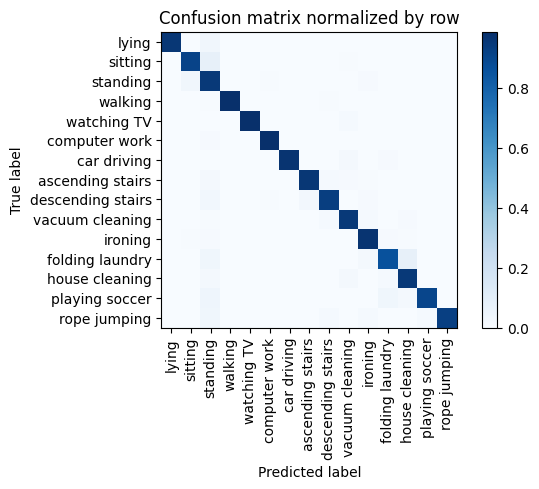

Training Epoch:  53%|█████▎    | 8/15 [07:09<06:17, 53.86s/it]

Overall accuracy: 0.954

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.995      0.985      0.990      0.134        592|	 standing: 0.010,	ironing: 0.003,	
          ironing       0.958      0.970      0.964      0.113        499|	 folding laundry: 0.010,	standing: 0.010,	
          walking       1.000      0.987      0.994      0.107        472|	 standing: 0.006,	descending stairs: 0.004,	
            lying       1.000      0.958      0.978      0.086        380|	 standing: 0.032,	house cleaning: 0.003,	
         standing       0.805      0.949      0.871      0.085        374|	 sitting: 0.032,	ironing: 0.011,	
   house cleaning       0.923      0.949      0.936      0.080        352|	 standing: 0.020,	vacuum cleaning: 0.017,	
  vacuum cleaning       0.957      0.951      0.954      0.079        347|	 ironing: 0.014,	descending stairs: 0.014,	
          sitting       0.953      0.913      0.932      0.075        3


train: 100%|██████████| 276/276 [00:48<00:00,  5.65batch/s, loss=10.1, accuracy=0.953]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:05<00:00, 12.05batch/s, loss=9.53]


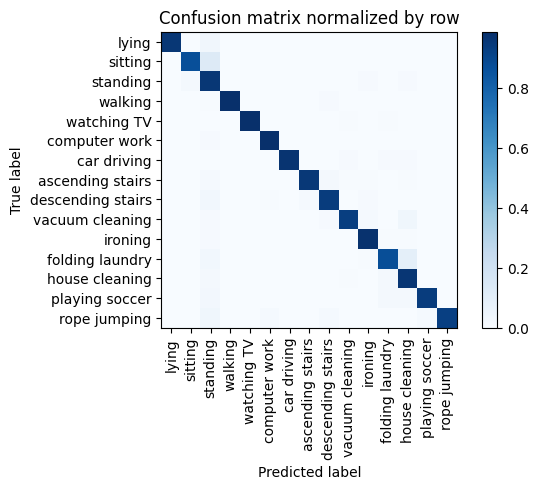

Training Epoch:  60%|██████    | 9/15 [08:04<05:25, 54.20s/it]

Overall accuracy: 0.953

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.995      0.987      0.991      0.135        597|	 standing: 0.008,	ironing: 0.003,	
          ironing       0.966      0.976      0.971      0.113        499|	 standing: 0.010,	house cleaning: 0.006,	
          walking       1.000      0.983      0.991      0.107        473|	 descending stairs: 0.008,	standing: 0.006,	
            lying       1.000      0.958      0.979      0.086        381|	 standing: 0.031,	house cleaning: 0.003,	
         standing       0.788      0.957      0.864      0.084        372|	 sitting: 0.022,	ironing: 0.011,	
   house cleaning       0.886      0.960      0.922      0.079        349|	 folding laundry: 0.017,	standing: 0.017,	
  vacuum cleaning       0.979      0.930      0.954      0.078        345|	 house cleaning: 0.038,	ironing: 0.014,	
          sitting       0.970      0.870      0.917      0.075        331|	


train: 100%|██████████| 276/276 [00:46<00:00,  5.93batch/s, loss=9.83, accuracy=0.953]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:05<00:00, 12.93batch/s, loss=9.4]


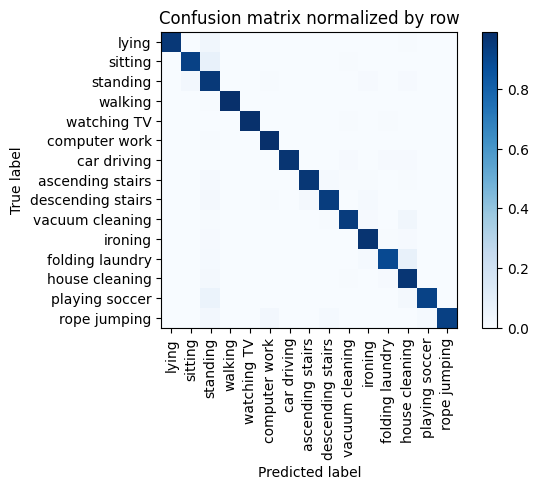

Training Epoch:  67%|██████▋   | 10/15 [08:56<04:28, 53.60s/it]

Overall accuracy: 0.961

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.992      0.990      0.991      0.135        594|	 standing: 0.007,	ironing: 0.003,	
          ironing       0.966      0.976      0.971      0.113        497|	 house cleaning: 0.008,	standing: 0.008,	
          walking       1.000      0.992      0.996      0.108        475|	 standing: 0.004,	ironing: 0.002,	
            lying       1.000      0.958      0.979      0.086        381|	 standing: 0.031,	house cleaning: 0.005,	
         standing       0.830      0.954      0.888      0.084        373|	 sitting: 0.024,	house cleaning: 0.008,	
   house cleaning       0.897      0.966      0.930      0.079        351|	 standing: 0.017,	folding laundry: 0.009,	
  vacuum cleaning       0.976      0.945      0.960      0.078        346|	 house cleaning: 0.032,	ironing: 0.009,	
          sitting       0.965      0.922      0.943      0.075        333|	 st


train: 100%|██████████| 276/276 [00:46<00:00,  5.99batch/s, loss=10.3, accuracy=0.969]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:05<00:00, 12.99batch/s, loss=9.23]


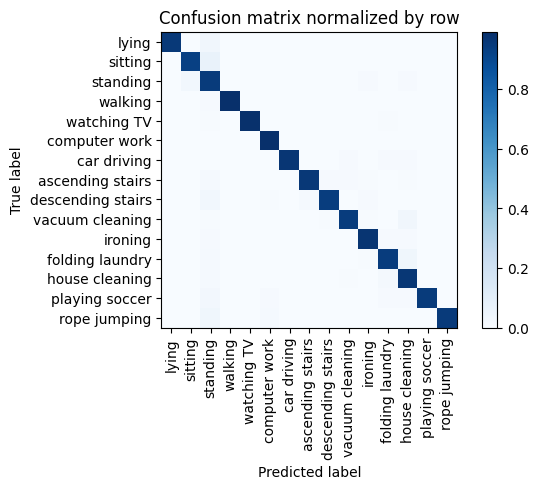

Training Epoch:  73%|███████▎  | 11/15 [09:48<03:32, 53.04s/it]

Overall accuracy: 0.964

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.993      0.993      0.993      0.135        596|	 ironing: 0.003,	standing: 0.003,	
          ironing       0.976      0.972      0.974      0.113        497|	 standing: 0.010,	house cleaning: 0.008,	
          walking       1.000      0.989      0.995      0.107        474|	 standing: 0.008,	descending stairs: 0.002,	
            lying       1.000      0.958      0.978      0.086        380|	 standing: 0.034,	house cleaning: 0.003,	
         standing       0.829      0.949      0.885      0.084        373|	 sitting: 0.029,	ironing: 0.011,	
   house cleaning       0.918      0.963      0.940      0.079        351|	 folding laundry: 0.017,	standing: 0.014,	
  vacuum cleaning       0.979      0.945      0.962      0.079        348|	 house cleaning: 0.034,	ironing: 0.006,	
          sitting       0.959      0.927      0.943      0.075        331|	


train: 100%|██████████| 276/276 [00:45<00:00,  6.04batch/s, loss=9.9, accuracy=0.984]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:05<00:00, 12.10batch/s, loss=8.77]


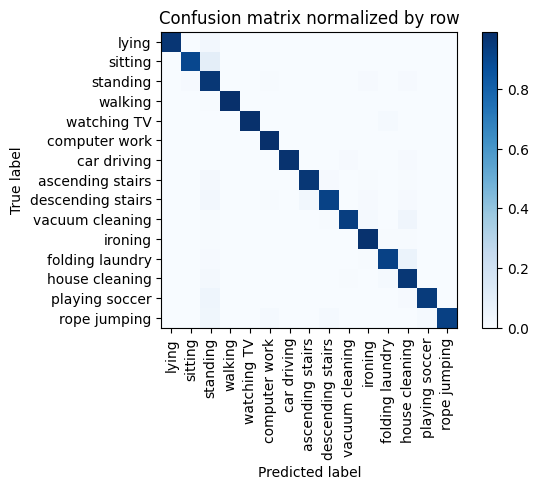

Training Epoch:  80%|████████  | 12/15 [10:40<02:38, 52.67s/it]

Overall accuracy: 0.962

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.993      0.992      0.992      0.135        594|	 ironing: 0.003,	standing: 0.003,	
          ironing       0.968      0.982      0.975      0.113        498|	 house cleaning: 0.006,	standing: 0.006,	
          walking       1.000      0.992      0.996      0.108        475|	 standing: 0.004,	ironing: 0.002,	
            lying       1.000      0.966      0.983      0.086        380|	 standing: 0.026,	house cleaning: 0.003,	
         standing       0.823      0.962      0.887      0.084        372|	 ironing: 0.011,	sitting: 0.011,	
   house cleaning       0.897      0.963      0.929      0.079        351|	 standing: 0.017,	folding laundry: 0.014,	
  vacuum cleaning       0.985      0.934      0.959      0.079        347|	 house cleaning: 0.040,	ironing: 0.014,	
          sitting       0.984      0.901      0.940      0.075        333|	 standing:


train: 100%|██████████| 276/276 [00:47<00:00,  5.84batch/s, loss=10.1, accuracy=0.953]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:05<00:00, 12.87batch/s, loss=9.65]


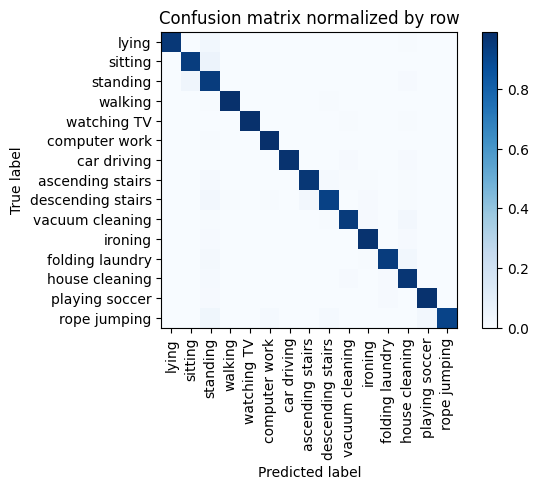

Training Epoch:  87%|████████▋ | 13/15 [11:33<01:45, 52.78s/it]

Overall accuracy: 0.964

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.995      0.992      0.993      0.135        594|	 standing: 0.005,	ironing: 0.003,	
          ironing       0.976      0.978      0.977      0.113        497|	 standing: 0.010,	house cleaning: 0.008,	
          walking       0.998      0.987      0.993      0.107        473|	 standing: 0.006,	descending stairs: 0.004,	
            lying       1.000      0.958      0.978      0.086        380|	 standing: 0.029,	house cleaning: 0.005,	
         standing       0.846      0.944      0.892      0.084        373|	 sitting: 0.040,	house cleaning: 0.011,	
   house cleaning       0.921      0.966      0.943      0.080        352|	 standing: 0.014,	folding laundry: 0.011,	
  vacuum cleaning       0.976      0.948      0.962      0.079        348|	 house cleaning: 0.026,	ironing: 0.011,	
          sitting       0.948      0.940      0.944      0.075      


train: 100%|██████████| 276/276 [00:47<00:00,  5.83batch/s, loss=9.41, accuracy=0.984]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:06<00:00, 11.09batch/s, loss=8.81]


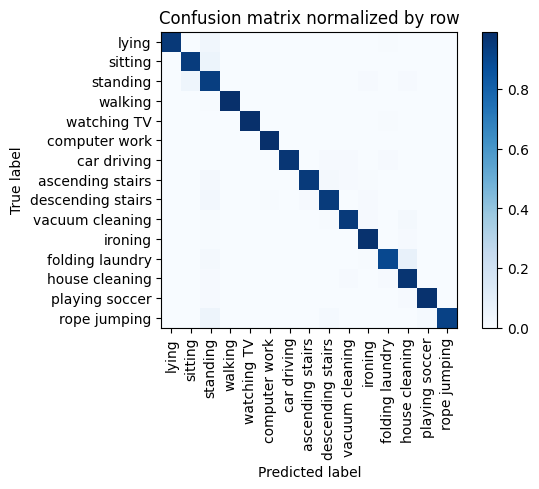

Training Epoch:  93%|█████████▎| 14/15 [12:27<00:53, 53.15s/it]

Overall accuracy: 0.964

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.997      0.992      0.994      0.135        594|	 ironing: 0.003,	standing: 0.003,	
          ironing       0.972      0.982      0.977      0.113        499|	 house cleaning: 0.008,	standing: 0.006,	
          walking       1.000      0.992      0.996      0.107        472|	 standing: 0.004,	ironing: 0.002,	
            lying       1.000      0.955      0.977      0.086        381|	 standing: 0.031,	folding laundry: 0.005,	
         standing       0.851      0.935      0.891      0.084        372|	 sitting: 0.043,	house cleaning: 0.011,	
   house cleaning       0.910      0.972      0.940      0.080        352|	 standing: 0.011,	folding laundry: 0.009,	
  vacuum cleaning       0.976      0.951      0.964      0.079        347|	 house cleaning: 0.023,	ironing: 0.012,	
          sitting       0.946      0.943      0.944      0.075        332|	 s


train: 100%|██████████| 276/276 [00:53<00:00,  5.12batch/s, loss=9.32, accuracy=0.953]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:08<00:00,  8.62batch/s, loss=8.8]


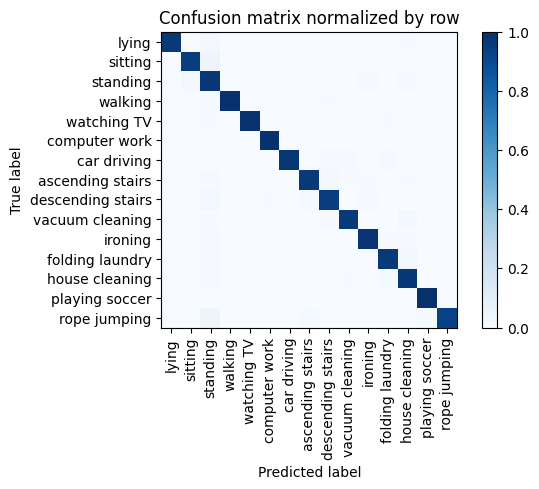

Overall accuracy: 0.971

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.998      0.992      0.995      0.135        596|	 ironing: 0.003,	standing: 0.003,	
          ironing       0.978      0.978      0.978      0.113        497|	 standing: 0.008,	house cleaning: 0.006,	
          walking       1.000      0.989      0.995      0.107        474|	 descending stairs: 0.004,	standing: 0.004,	
            lying       1.000      0.958      0.979      0.086        381|	 standing: 0.029,	house cleaning: 0.005,	
         standing       0.868      0.965      0.914      0.085        374|	 sitting: 0.016,	house cleaning: 0.011,	
   house cleaning       0.939      0.966      0.952      0.080        352|	 folding laundry: 0.014,	standing: 0.011,	
  vacuum cleaning       0.982      0.963      0.972      0.079        347|	 house cleaning: 0.017,	descending stairs: 0.009,	
          sitting       0.975      0.949      0.962      0

torch.Size([3, 2048])


unseen: 100%|██████████| 68/68 [00:05<00:00, 12.02batch/s, loss=15.2]


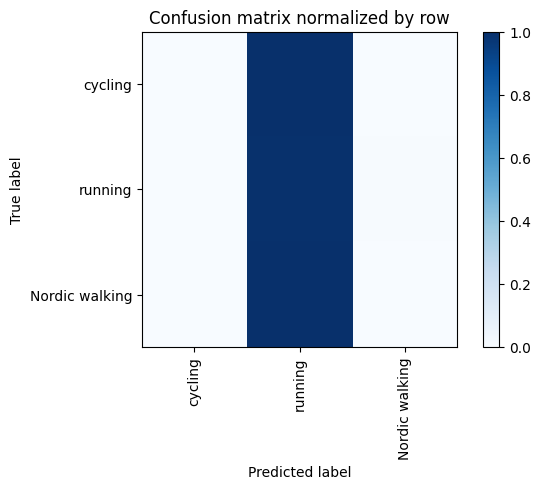

Overall accuracy: 0.215

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.000      0.000      0.000      0.419       1823|	 running: 1.000,	cycling: 0.000,	
       cycling       0.000      0.000      0.000      0.365       1588|	 running: 1.000,	Nordic walking: 0.000,	
       running       0.215      0.995      0.354      0.216        941|	 Nordic walking: 0.005,	cycling: 0.000,	

----------------------------------------------------------------------------------------------------
   avg / total       0.047      0.215      0.077        1.0       4352|	      

{'accuracy': 0.21507352941176472, 'precision': 0.0717736369910283, 'recall': 0.33156216790648246, 'f1': 0.11800302571860817}
================ Fold-4 ================
Unseen Classes : ['ironing', 'car driving', 'folding laundry']
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 

Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([15, 2048])



train: 100%|██████████| 283/283 [00:47<00:00,  5.91batch/s, loss=11.4, accuracy=0.891]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:05<00:00, 12.90batch/s, loss=10.5]


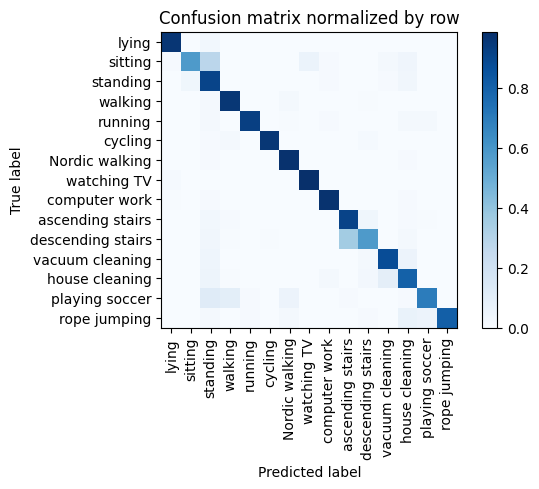

Training Epoch:   7%|▋         | 1/15 [00:53<12:31, 53.68s/it]

Overall accuracy: 0.883

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.972      0.975      0.973      0.133        598|	 house cleaning: 0.010,	standing: 0.008,	
          walking       0.953      0.961      0.957      0.109        487|	 Nordic walking: 0.016,	standing: 0.016,	
            lying       0.975      0.962      0.968      0.082        366|	 standing: 0.027,	house cleaning: 0.003,	
   house cleaning       0.800      0.802      0.801      0.081        364|	 vacuum cleaning: 0.096,	standing: 0.049,	
          sitting       0.940      0.579      0.717      0.079        354|	 standing: 0.280,	watching TV: 0.059,	
   Nordic walking       0.956      0.977      0.966      0.079        353|	 house cleaning: 0.011,	standing: 0.008,	
  vacuum cleaning       0.869      0.879      0.874      0.078        348|	 house cleaning: 0.057,	standing: 0.043,	
         standing       0.625      0.911      0.741      0.077   


train: 100%|██████████| 283/283 [00:47<00:00,  5.91batch/s, loss=10.7, accuracy=0.906]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:05<00:00, 12.72batch/s, loss=10.5]


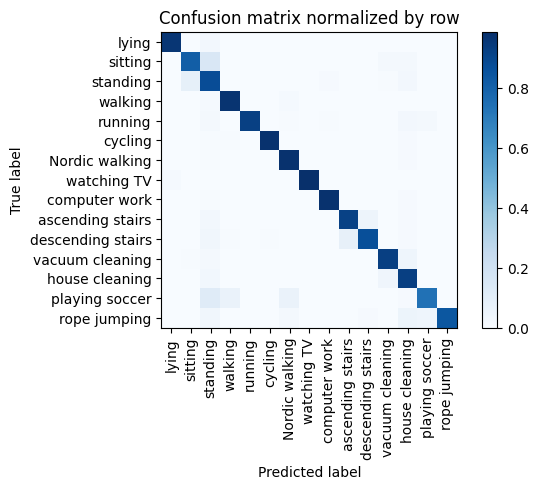

Training Epoch:  13%|█▎        | 2/15 [01:47<11:39, 53.79s/it]

Overall accuracy: 0.930

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.990      0.980      0.985      0.133        594|	 house cleaning: 0.010,	standing: 0.007,	
          walking       0.977      0.969      0.973      0.108        486|	 standing: 0.014,	Nordic walking: 0.012,	
            lying       0.989      0.965      0.977      0.082        367|	 standing: 0.025,	house cleaning: 0.003,	
   house cleaning       0.844      0.928      0.884      0.081        362|	 vacuum cleaning: 0.039,	standing: 0.028,	
   Nordic walking       0.958      0.977      0.968      0.079        353|	 house cleaning: 0.011,	standing: 0.006,	
          sitting       0.900      0.813      0.854      0.079        353|	 standing: 0.147,	house cleaning: 0.020,	
         standing       0.719      0.877      0.790      0.078        350|	 sitting: 0.083,	house cleaning: 0.026,	
  vacuum cleaning       0.934      0.928      0.931      0.078 


train: 100%|██████████| 283/283 [00:54<00:00,  5.15batch/s, loss=10.9, accuracy=0.922]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:05<00:00, 12.51batch/s, loss=10.4]


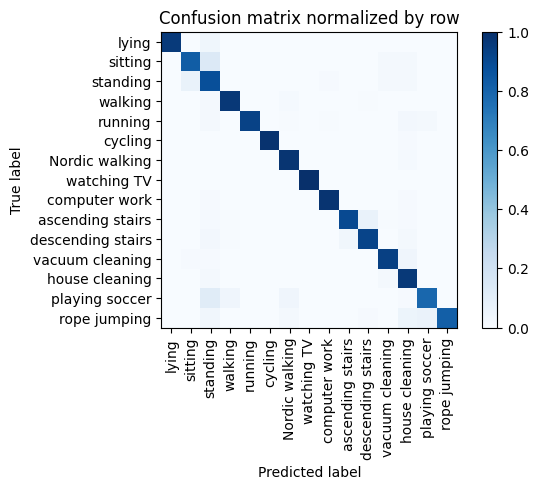

Training Epoch:  20%|██        | 3/15 [02:48<11:24, 57.08s/it]

Overall accuracy: 0.938

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.993      0.983      0.988      0.133        597|	 house cleaning: 0.008,	standing: 0.008,	
          walking       0.985      0.967      0.976      0.108        484|	 standing: 0.017,	Nordic walking: 0.012,	
   house cleaning       0.854      0.964      0.906      0.081        364|	 standing: 0.019,	vacuum cleaning: 0.016,	
            lying       1.000      0.959      0.979      0.081        364|	 standing: 0.038,	house cleaning: 0.003,	
          sitting       0.913      0.826      0.867      0.079        356|	 standing: 0.135,	house cleaning: 0.020,	
   Nordic walking       0.964      0.977      0.971      0.079        354|	 house cleaning: 0.014,	walking: 0.003,	
  vacuum cleaning       0.942      0.934      0.938      0.078        350|	 house cleaning: 0.043,	standing: 0.011,	
         standing       0.732      0.883      0.800      0.078 


train: 100%|██████████| 283/283 [00:47<00:00,  5.90batch/s, loss=9.66, accuracy=0.922]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:05<00:00, 12.60batch/s, loss=10.6]


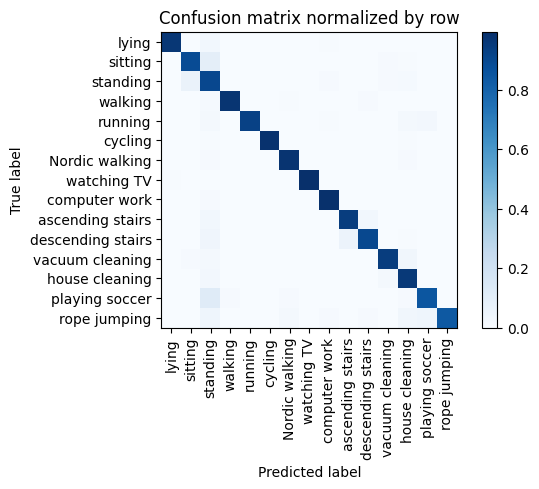

Training Epoch:  27%|██▋       | 4/15 [03:42<10:14, 55.84s/it]

Overall accuracy: 0.948

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.987      0.990      0.988      0.133        596|	 standing: 0.008,	house cleaning: 0.002,	
          walking       0.994      0.973      0.983      0.108        484|	 standing: 0.014,	descending stairs: 0.008,	
            lying       0.997      0.964      0.981      0.082        366|	 standing: 0.027,	computer work: 0.005,	
   house cleaning       0.911      0.956      0.933      0.081        362|	 standing: 0.025,	vacuum cleaning: 0.019,	
          sitting       0.924      0.887      0.905      0.079        354|	 standing: 0.093,	vacuum cleaning: 0.011,	
  vacuum cleaning       0.957      0.943      0.950      0.079        353|	 house cleaning: 0.031,	standing: 0.017,	
   Nordic walking       0.986      0.977      0.981      0.078        351|	 house cleaning: 0.009,	standing: 0.009,	
         standing       0.744      0.902      0.816      0.


train: 100%|██████████| 283/283 [00:47<00:00,  5.98batch/s, loss=9.62, accuracy=0.969]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:05<00:00, 12.74batch/s, loss=9.64]


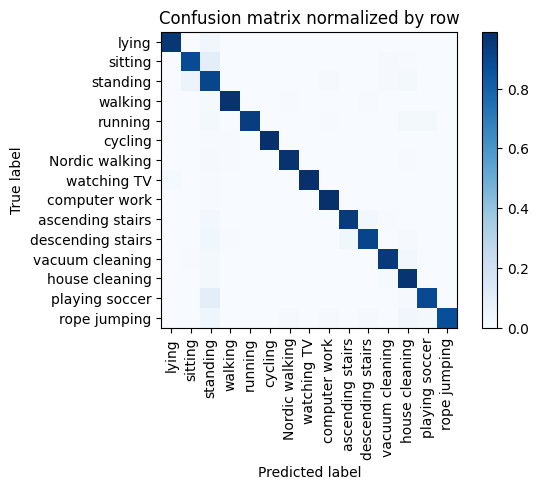

Training Epoch:  33%|███▎      | 5/15 [04:35<09:08, 54.89s/it]

Overall accuracy: 0.952

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.988      0.990      0.989      0.133        597|	 standing: 0.007,	house cleaning: 0.003,	
          walking       0.990      0.975      0.982      0.108        485|	 standing: 0.014,	descending stairs: 0.006,	
            lying       0.994      0.962      0.978      0.081        364|	 standing: 0.033,	house cleaning: 0.003,	
   house cleaning       0.914      0.969      0.941      0.080        360|	 standing: 0.017,	vacuum cleaning: 0.014,	
          sitting       0.934      0.882      0.907      0.079        355|	 standing: 0.099,	vacuum cleaning: 0.011,	
   Nordic walking       0.991      0.977      0.984      0.079        353|	 standing: 0.008,	house cleaning: 0.006,	
  vacuum cleaning       0.960      0.951      0.956      0.078        350|	 house cleaning: 0.026,	standing: 0.017,	
         standing       0.749      0.905      0.819      0


train: 100%|██████████| 283/283 [00:47<00:00,  5.95batch/s, loss=9.74, accuracy=0.969]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:05<00:00, 12.60batch/s, loss=9.75]


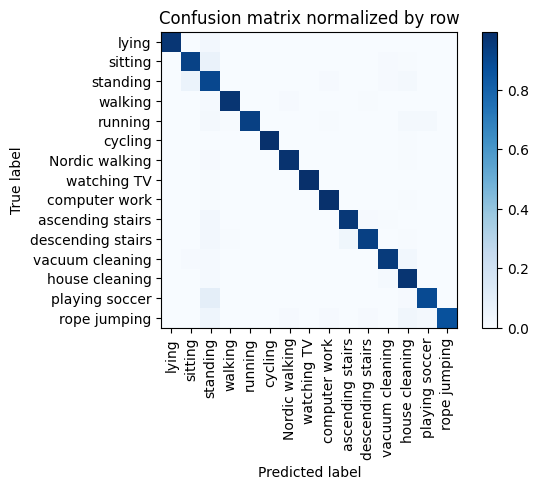

Training Epoch:  40%|████      | 6/15 [05:29<08:09, 54.42s/it]

Overall accuracy: 0.958

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.990      0.990      0.990      0.133        598|	 house cleaning: 0.005,	standing: 0.005,	
          walking       0.992      0.973      0.982      0.108        484|	 standing: 0.012,	Nordic walking: 0.008,	
            lying       1.000      0.967      0.983      0.082        367|	 standing: 0.025,	playing soccer: 0.003,	
   house cleaning       0.909      0.972      0.940      0.080        360|	 vacuum cleaning: 0.014,	standing: 0.014,	
          sitting       0.929      0.921      0.925      0.079        353|	 standing: 0.065,	vacuum cleaning: 0.008,	
   Nordic walking       0.986      0.980      0.983      0.079        352|	 standing: 0.009,	house cleaning: 0.006,	
  vacuum cleaning       0.962      0.949      0.956      0.078        351|	 house cleaning: 0.028,	standing: 0.014,	
         standing       0.794      0.903      0.845      0.07


train: 100%|██████████| 283/283 [00:50<00:00,  5.60batch/s, loss=9.68, accuracy=0.938]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:07<00:00,  8.92batch/s, loss=9.01]


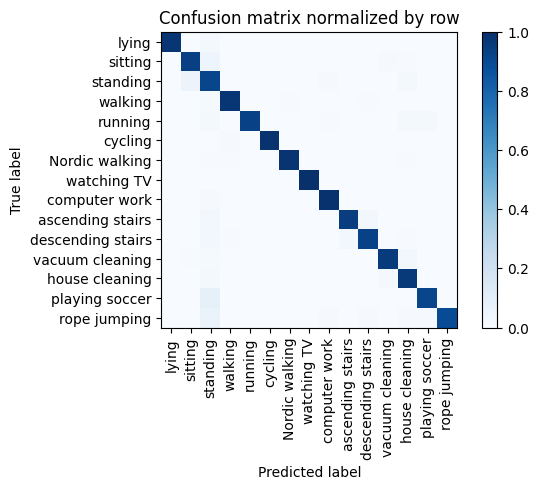

Training Epoch:  47%|████▋     | 7/15 [06:28<07:27, 55.90s/it]

Overall accuracy: 0.960

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.990      0.990      0.990      0.133        596|	 standing: 0.008,	house cleaning: 0.002,	
          walking       0.987      0.973      0.980      0.107        481|	 standing: 0.012,	descending stairs: 0.006,	
            lying       1.000      0.973      0.986      0.082        367|	 standing: 0.022,	house cleaning: 0.003,	
   house cleaning       0.926      0.964      0.944      0.081        361|	 vacuum cleaning: 0.019,	standing: 0.017,	
          sitting       0.938      0.935      0.937      0.079        356|	 standing: 0.051,	vacuum cleaning: 0.008,	
   Nordic walking       0.991      0.980      0.986      0.079        353|	 house cleaning: 0.006,	walking: 0.006,	
  vacuum cleaning       0.968      0.954      0.961      0.078        348|	 house cleaning: 0.026,	standing: 0.014,	
         standing       0.796      0.916      0.852      0.


train: 100%|██████████| 283/283 [00:54<00:00,  5.18batch/s, loss=9.78, accuracy=0.969]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:06<00:00, 10.41batch/s, loss=8.47]


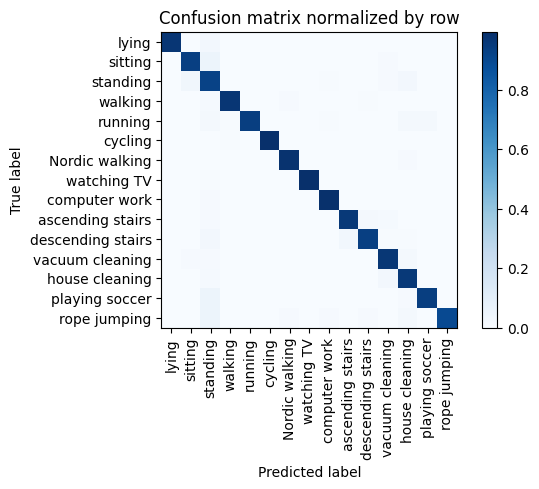

Training Epoch:  53%|█████▎    | 8/15 [07:29<06:44, 57.79s/it]

Overall accuracy: 0.962

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.992      0.990      0.991      0.133        597|	 standing: 0.008,	house cleaning: 0.002,	
          walking       0.992      0.969      0.980      0.108        482|	 standing: 0.012,	Nordic walking: 0.010,	
            lying       1.000      0.967      0.983      0.082        368|	 standing: 0.027,	house cleaning: 0.003,	
   house cleaning       0.926      0.959      0.942      0.081        363|	 vacuum cleaning: 0.025,	standing: 0.014,	
          sitting       0.954      0.935      0.944      0.079        354|	 standing: 0.051,	vacuum cleaning: 0.011,	
   Nordic walking       0.983      0.980      0.982      0.079        352|	 house cleaning: 0.009,	descending stairs: 0.003,	
  vacuum cleaning       0.939      0.966      0.952      0.078        348|	 house cleaning: 0.017,	standing: 0.009,	
         standing       0.818      0.922      0.867 


train: 100%|██████████| 283/283 [00:52<00:00,  5.40batch/s, loss=9.55, accuracy=0.953]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:05<00:00, 12.36batch/s, loss=8.62]


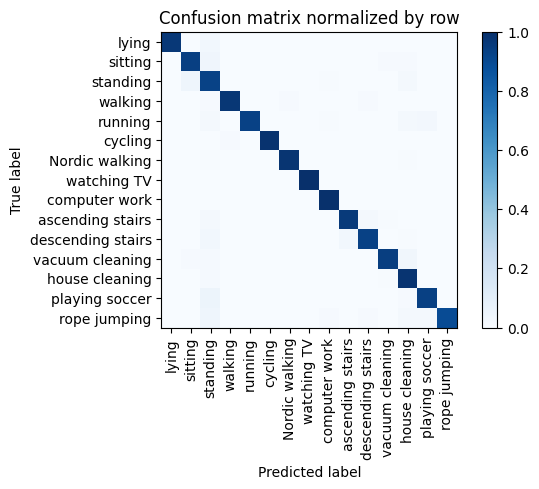

Training Epoch:  60%|██████    | 9/15 [08:28<05:48, 58.01s/it]

Overall accuracy: 0.963

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.992      0.995      0.993      0.133        595|	 standing: 0.003,	house cleaning: 0.002,	
          walking       0.992      0.969      0.980      0.108        483|	 Nordic walking: 0.010,	standing: 0.010,	
            lying       1.000      0.967      0.983      0.081        364|	 standing: 0.027,	house cleaning: 0.003,	
   house cleaning       0.908      0.981      0.943      0.081        363|	 standing: 0.014,	vacuum cleaning: 0.006,	
          sitting       0.946      0.941      0.944      0.079        355|	 standing: 0.042,	house cleaning: 0.008,	
   Nordic walking       0.986      0.980      0.983      0.079        352|	 house cleaning: 0.006,	standing: 0.006,	
         standing       0.831      0.928      0.877      0.078        349|	 sitting: 0.043,	house cleaning: 0.023,	
  vacuum cleaning       0.979      0.942      0.960      0.077 


train: 100%|██████████| 283/283 [00:48<00:00,  5.89batch/s, loss=9.95, accuracy=0.969]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:05<00:00, 11.75batch/s, loss=8.89]


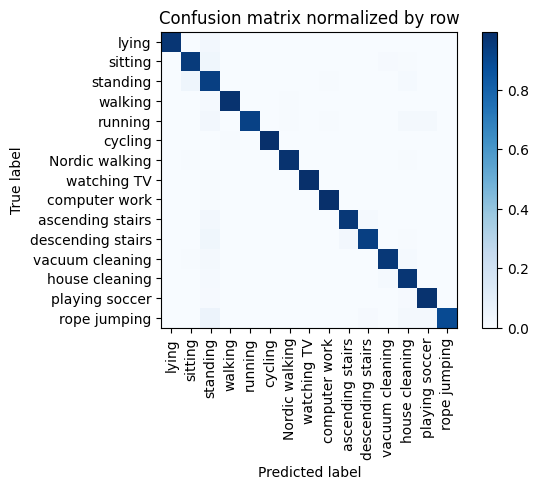

Training Epoch:  67%|██████▋   | 10/15 [09:22<04:44, 56.92s/it]

Overall accuracy: 0.967

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.993      0.993      0.993      0.134        601|	 standing: 0.007,	rope jumping: 0.000,	
          walking       0.994      0.979      0.987      0.108        486|	 standing: 0.012,	Nordic walking: 0.004,	
            lying       1.000      0.967      0.983      0.082        369|	 standing: 0.027,	house cleaning: 0.003,	
   house cleaning       0.941      0.970      0.955      0.081        363|	 vacuum cleaning: 0.014,	standing: 0.014,	
          sitting       0.944      0.949      0.946      0.079        354|	 standing: 0.037,	vacuum cleaning: 0.008,	
   Nordic walking       0.991      0.980      0.986      0.078        351|	 house cleaning: 0.006,	sitting: 0.006,	
         standing       0.823      0.934      0.875      0.078        349|	 sitting: 0.046,	house cleaning: 0.014,	
  vacuum cleaning       0.974      0.960      0.967      0.078   


train: 100%|██████████| 283/283 [00:51<00:00,  5.50batch/s, loss=9.94, accuracy=0.984]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:06<00:00, 11.14batch/s, loss=9.24]


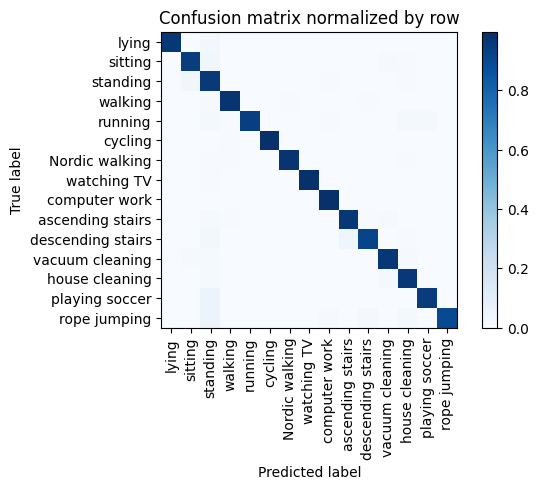

Training Epoch:  73%|███████▎  | 11/15 [10:21<03:49, 57.33s/it]

Overall accuracy: 0.968

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.992      0.997      0.994      0.134        599|	 standing: 0.003,	rope jumping: 0.000,	
          walking       0.988      0.979      0.983      0.108        485|	 standing: 0.010,	descending stairs: 0.004,	
            lying       1.000      0.967      0.983      0.082        367|	 standing: 0.027,	house cleaning: 0.003,	
   house cleaning       0.954      0.964      0.959      0.081        364|	 vacuum cleaning: 0.019,	standing: 0.014,	
          sitting       0.957      0.946      0.951      0.079        352|	 standing: 0.037,	vacuum cleaning: 0.011,	
  vacuum cleaning       0.960      0.966      0.963      0.078        351|	 standing: 0.014,	house cleaning: 0.011,	
   Nordic walking       0.994      0.980      0.987      0.078        351|	 house cleaning: 0.006,	walking: 0.006,	
         standing       0.835      0.957      0.892      0.07


train: 100%|██████████| 283/283 [00:47<00:00,  5.94batch/s, loss=9.55, accuracy=0.969]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:05<00:00, 12.65batch/s, loss=9.12]


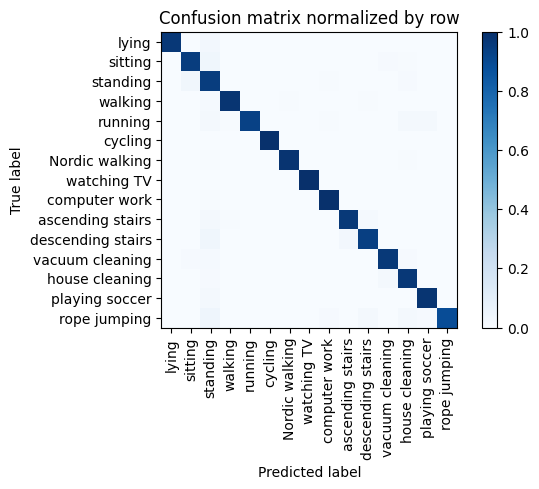

Training Epoch:  80%|████████  | 12/15 [11:14<02:48, 56.19s/it]

Overall accuracy: 0.969

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.992      0.995      0.993      0.134        600|	 standing: 0.005,	rope jumping: 0.000,	
          walking       0.989      0.977      0.983      0.107        478|	 standing: 0.013,	descending stairs: 0.006,	
            lying       1.000      0.967      0.983      0.082        366|	 standing: 0.027,	house cleaning: 0.003,	
   house cleaning       0.951      0.967      0.959      0.081        365|	 vacuum cleaning: 0.016,	standing: 0.011,	
          sitting       0.955      0.949      0.952      0.079        354|	 standing: 0.037,	vacuum cleaning: 0.008,	
   Nordic walking       0.994      0.983      0.989      0.078        351|	 house cleaning: 0.006,	standing: 0.006,	
  vacuum cleaning       0.974      0.963      0.968      0.078        350|	 standing: 0.014,	house cleaning: 0.011,	
         standing       0.836      0.948      0.889      0.0


train: 100%|██████████| 283/283 [00:47<00:00,  5.95batch/s, loss=9.86, accuracy=0.984]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:05<00:00, 12.56batch/s, loss=9.75]


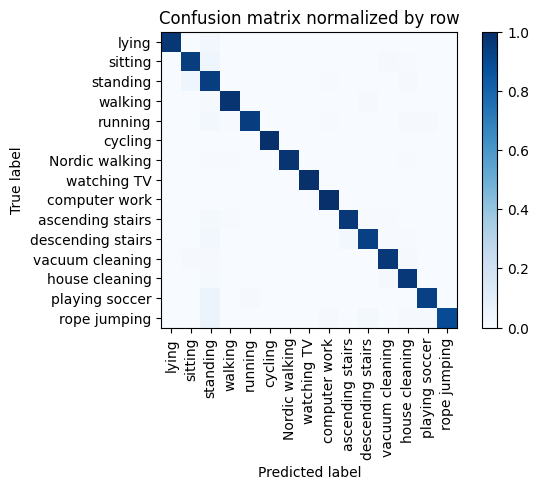

Training Epoch:  87%|████████▋ | 13/15 [12:08<01:50, 55.40s/it]

Overall accuracy: 0.969

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.992      0.998      0.995      0.134        599|	 standing: 0.002,	rope jumping: 0.000,	
          walking       0.990      0.979      0.985      0.109        487|	 standing: 0.010,	descending stairs: 0.008,	
            lying       1.000      0.970      0.985      0.082        369|	 standing: 0.024,	house cleaning: 0.003,	
   house cleaning       0.957      0.967      0.962      0.081        365|	 vacuum cleaning: 0.016,	standing: 0.014,	
          sitting       0.949      0.946      0.948      0.079        354|	 standing: 0.040,	vacuum cleaning: 0.008,	
   Nordic walking       1.000      0.980      0.990      0.078        349|	 house cleaning: 0.006,	walking: 0.006,	
  vacuum cleaning       0.966      0.968      0.967      0.078        348|	 house cleaning: 0.011,	standing: 0.011,	
         standing       0.834      0.945      0.886      0.07


train: 100%|██████████| 283/283 [00:47<00:00,  5.95batch/s, loss=8.89, accuracy=0.984]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:05<00:00, 12.48batch/s, loss=9.41]


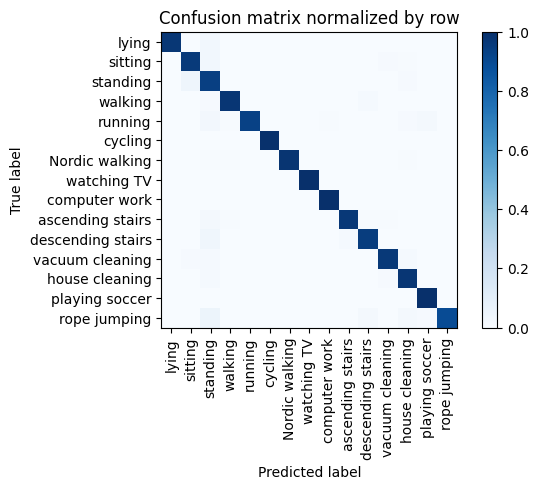

Training Epoch:  93%|█████████▎| 14/15 [13:01<00:54, 54.84s/it]

Overall accuracy: 0.971

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.997      0.997      0.997      0.134        600|	 standing: 0.003,	rope jumping: 0.000,	
          walking       0.989      0.975      0.982      0.107        480|	 descending stairs: 0.013,	standing: 0.010,	
            lying       1.000      0.970      0.985      0.081        364|	 standing: 0.027,	house cleaning: 0.003,	
   house cleaning       0.949      0.975      0.962      0.081        362|	 standing: 0.014,	vacuum cleaning: 0.008,	
          sitting       0.944      0.958      0.951      0.079        354|	 standing: 0.028,	vacuum cleaning: 0.008,	
   Nordic walking       1.000      0.980      0.990      0.079        352|	 house cleaning: 0.006,	walking: 0.006,	
  vacuum cleaning       0.977      0.963      0.970      0.078        349|	 house cleaning: 0.014,	standing: 0.014,	
         standing       0.845      0.940      0.890      0.07


train: 100%|██████████| 283/283 [00:47<00:00,  5.99batch/s, loss=9.19, accuracy=0.953]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:05<00:00, 12.03batch/s, loss=9.24]


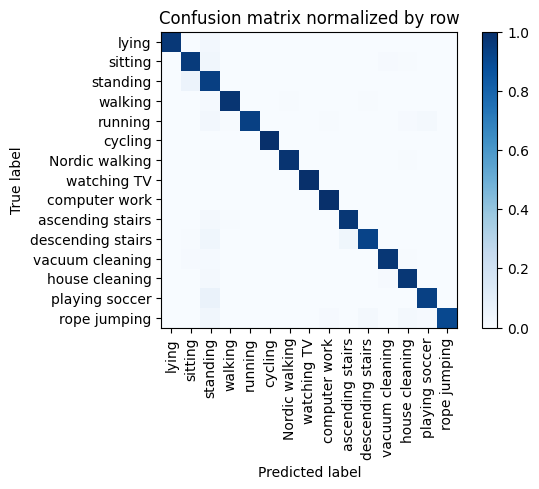

Overall accuracy: 0.969

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.993      0.997      0.995      0.134        600|	 standing: 0.003,	rope jumping: 0.000,	
          walking       0.994      0.977      0.985      0.108        483|	 standing: 0.012,	descending stairs: 0.004,	
            lying       1.000      0.967      0.983      0.082        367|	 standing: 0.027,	house cleaning: 0.003,	
   house cleaning       0.967      0.973      0.970      0.081        364|	 standing: 0.016,	vacuum cleaning: 0.011,	
  vacuum cleaning       0.977      0.972      0.974      0.079        352|	 standing: 0.014,	sitting: 0.009,	
   Nordic walking       0.994      0.983      0.989      0.078        351|	 house cleaning: 0.006,	standing: 0.006,	
          sitting       0.933      0.954      0.944      0.078        350|	 standing: 0.031,	vacuum cleaning: 0.009,	
         standing       0.824      0.939      0.878      0.077     

unseen: 100%|██████████| 60/60 [00:04<00:00, 13.18batch/s, loss=12.9]


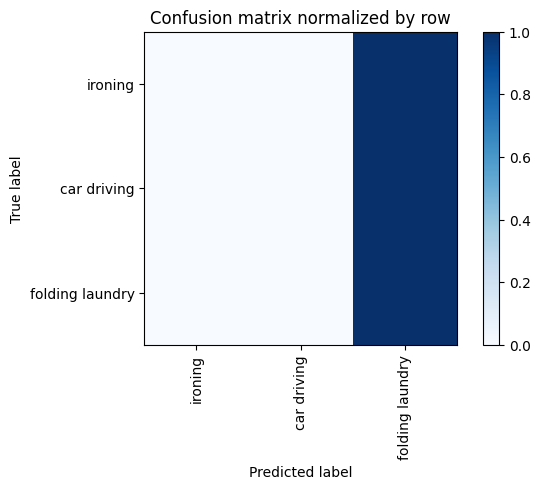

Overall accuracy: 0.252

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       0.000      0.000      0.000      0.608       2334|	 folding laundry: 1.000,	car driving: 0.000,	
folding laundry       0.252      1.000      0.403      0.252        969|	 car driving: 0.000,	ironing: 0.000,	
    car driving       0.000      0.000      0.000      0.140        537|	 folding laundry: 1.000,	ironing: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.064      0.252      0.102 0.9999999999999999       3840|	      

{'accuracy': 0.25234375, 'precision': 0.08411458333333333, 'recall': 0.3333333333333333, 'f1': 0.13433146184237885}
============== Overall Unseen Classes Performance ==============


accuracy     0.383003
precision    0.409178
recall       0.422252
f1           0.322088
dtype: float64

In [38]:
fold_metric_scores = []
for i, cs in enumerate(fold_cls_ids):
    print("=" * 16, f'Fold-{i}', "=" * 16)
    print(f'Unseen Classes : {fold_classes[i]}')

    data_dict = dataReader.generate(unseen_classes=cs, seen_ratio=config['seen_split'],
                                    unseen_ratio=config['unseen_split'], window_size=5.21, window_overlap=4.21,
                                    resample_freq=20)
    all_classes = dataReader.idToLabel
    seen_classes = data_dict['seen_classes']
    unseen_classes = data_dict['unseen_classes']
    print("seen classes > ", seen_classes)
    print("unseen classes > ", unseen_classes)
    train_n, in_ft = data_dict['train']['X'].shape

    print("Initiate IMU datasets ...")
    # build IMU datasets
    train_dt = PAMAP2Dataset(data=data_dict['train']['X'], actions=data_dict['train']['y'], attributes=video_feat,
                             attribute_dict=action_dict, action_classes=seen_classes, seq_len=100)
    train_dl = DataLoader(train_dt, batch_size=config['batch_size'], shuffle=True, pin_memory=True, drop_last=True)
    # build seen eval_dt
    eval_dt = PAMAP2Dataset(data=data_dict['eval-seen']['X'], actions=data_dict['eval-seen']['y'],
                            attributes=video_feat, attribute_dict=action_dict, action_classes=seen_classes, seq_len=100)
    eval_dl = DataLoader(eval_dt, batch_size=config['batch_size'], shuffle=True, pin_memory=True, drop_last=True)
    # build unseen test_dt
    test_dt = PAMAP2Dataset(data=data_dict['test']['X'], actions=data_dict['test']['y'], attributes=video_feat,
                            attribute_dict=action_dict, action_classes=unseen_classes, seq_len=100)
    test_dl = DataLoader(test_dt, batch_size=config['batch_size'], shuffle=True, pin_memory=True, drop_last=True)

    # build model
    model = SOTAEmbedding(
        linear_filters=config["model_params"]["linear_filters"],
        input_feat=config["model_params"]["input_feat"],
        dropout=config["model_params"]["dropout"]
    )
    # model = Model1(feat_dim=in_ft, max_len=seq_len, d_model=config['d_model'], n_heads=config['num_heads'], num_layers=2, dim_feedforward=128, ft_size=feat_size)
    model.to(device)
    # define run parameters 
    optimizer = Adam(model.parameters(), lr=config['lr'], weight_decay=1e-5)
    loss_module = {'class': nn.CrossEntropyLoss(reduction="sum"), 'feature': nn.L1Loss(reduction="sum")}
    best_acc = 0.0
    # train the model 
    for epoch in tqdm(range(config['n_epochs']), desc='Training Epoch', leave=False):
        train_metrics = train_step(model, train_dl, train_dt, optimizer, loss_module, device,
                                   class_names=[all_classes[i] for i in seen_classes], phase='train', loss_alpha=0.0001)
        eval_metrics = eval_step(model, eval_dl, eval_dt, loss_module, device,
                                 class_names=[all_classes[i] for i in seen_classes], phase='seen', print_report=True,
                                 loss_alpha=0.0001)
        # print(f"EPOCH [{epoch}] TRAINING : {train_metrics}")
        # print(f"EPOCH [{epoch}] EVAL : {eval_metrics}")
        if eval_metrics['accuracy'] > best_acc:
            best_model = deepcopy(model.state_dict())

    # replace by best model 
    model.load_state_dict(best_model)
    save_model(model, notebook_iden, model_iden, i)

    # run evaluation on unseen classes
    test_metrics = eval_step(model, test_dl, test_dt, loss_module, device,
                             class_names=[all_classes[i] for i in unseen_classes], phase='unseen', loss_alpha=0.0001)
    fold_metric_scores.append(test_metrics)
    print(test_metrics)
    print("=" * 40)

print("=" * 14, "Overall Unseen Classes Performance", "=" * 14)
seen_score_df = pd.DataFrame.from_records(fold_metric_scores)
seen_score_df.mean()
